In [1]:
#Business Case

# The client owns a construction company that renovates homes for clients and also buys homes to renovate and then sell.
# What insights can be found for this business?

#1. How do home renovations effect house prices?
#2. What criterea should be attempted to be acheived by renovations?
#3. Where should property searches be conducted for renovating properties and marketing for clients?


In [2]:
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
style.use('ggplot')
%matplotlib inline


In [3]:
#investigate data frame
data = pd.read_csv('kc_house_data.csv')

In [4]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [6]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [7]:
data.isnull().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [8]:
# Clean and organise data.

In [9]:
# Drop id column as no relevance
cln_data = data

In [10]:
cln_data.drop(columns=['id'], axis=1, inplace=True)

In [11]:
# Fill missing values

In [12]:
# Change basement to numeric (note*found string in the data so needed to correct first)
# Change basement ? to 0
cln_data.sqft_basement.replace('?', 0.0, inplace = True)
cln_data['sqft_basement'] = data['sqft_basement'].astype('float64')

In [13]:
# Investigate waterfront NaN
cln_data.waterfront.value_counts()

waterfront
0.0    19075
1.0      146
Name: count, dtype: int64

In [14]:
# with only 146 properties showing as waterfront view, 0.68% of data, I will change NaN to 0 
cln_data.waterfront.fillna(0.0, inplace=True)

In [15]:
# Investigate view NaN
cln_data.view.value_counts()

view
0.0    19422
2.0      957
3.0      508
1.0      330
4.0      317
Name: count, dtype: int64

In [16]:
# Definition provided "**view** - Has been viewed". 
# I will drop this column as I cannot make sense of the data and it only has 10 of entries that are not 0
cln_data.drop(columns=['view'], inplace=True)

In [17]:
#Convert year_built to age
cln_data['age'] = 2016 - data.yr_built
cln_data = data.drop(columns=['yr_built'], axis=1)

In [18]:
# assuming that properties with NaN for yr_renovated have not been renovated
cln_data.yr_renovated.fillna(0.0, inplace=True)

In [19]:
#Convert date column to 2 separate columns for month and year, do not think day will be relevant
date = data['date'].str.split('/', expand=True)
cln_data['month_sold'] = date[0].astype(np.int64)
cln_data['year_sold'] = date[2].astype(np.int64)

#Drop original date column
cln_data.drop(columns=['date'], axis=1, inplace=True)

In [20]:
cln_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21597 non-null  float64
 1   bedrooms       21597 non-null  int64  
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  int64  
 4   sqft_lot       21597 non-null  int64  
 5   floors         21597 non-null  float64
 6   waterfront     21597 non-null  float64
 7   condition      21597 non-null  int64  
 8   grade          21597 non-null  int64  
 9   sqft_above     21597 non-null  int64  
 10  sqft_basement  21597 non-null  float64
 11  yr_renovated   21597 non-null  float64
 12  zipcode        21597 non-null  int64  
 13  lat            21597 non-null  float64
 14  long           21597 non-null  float64
 15  sqft_living15  21597 non-null  int64  
 16  sqft_lot15     21597 non-null  int64  
 17  age            21597 non-null  int64  
 18  month_

In [21]:
#remove scientific notation for clarity
pd.set_option('display.float_format', lambda x: '%.4f' % x)

In [22]:
cln_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21597 non-null  float64
 1   bedrooms       21597 non-null  int64  
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  int64  
 4   sqft_lot       21597 non-null  int64  
 5   floors         21597 non-null  float64
 6   waterfront     21597 non-null  float64
 7   condition      21597 non-null  int64  
 8   grade          21597 non-null  int64  
 9   sqft_above     21597 non-null  int64  
 10  sqft_basement  21597 non-null  float64
 11  yr_renovated   21597 non-null  float64
 12  zipcode        21597 non-null  int64  
 13  lat            21597 non-null  float64
 14  long           21597 non-null  float64
 15  sqft_living15  21597 non-null  int64  
 16  sqft_lot15     21597 non-null  int64  
 17  age            21597 non-null  int64  
 18  month_

In [23]:
#Investigate single variable distribution and remove outliers
data.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age
count,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,17755.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000,21597.0000
mean,540296.5735,3.3732,2.1158,2080.3219,15099.4088,1.4941,0.0068,3.4098,7.6579,1788.5968,285.7166,1970.9997,83.6368,98077.9518,47.5601,-122.2140,1986.6203,12758.2835,45.0003
std,367368.1401,0.9263,0.7690,918.1061,41412.6369,0.5397,0.0819,0.6505,1.1732,827.7598,439.8198,29.3752,399.9464,53.5131,0.1386,0.1407,685.2305,27274.4420,29.3752
min,78000.0000,1.0000,0.5000,370.0000,520.0000,1.0000,0.0000,1.0000,3.0000,370.0000,0.0000,1900.0000,0.0000,98001.0000,47.1559,-122.5190,399.0000,651.0000,1.0000
25%,322000.0000,3.0000,1.7500,1430.0000,5040.0000,1.0000,0.0000,3.0000,7.0000,1190.0000,0.0000,1951.0000,0.0000,98033.0000,47.4711,-122.3280,1490.0000,5100.0000,19.0000
50%,450000.0000,3.0000,2.2500,1910.0000,7618.0000,1.5000,0.0000,3.0000,7.0000,1560.0000,0.0000,1975.0000,0.0000,98065.0000,47.5718,-122.2310,1840.0000,7620.0000,41.0000
75%,645000.0000,4.0000,2.5000,2550.0000,10685.0000,2.0000,0.0000,4.0000,8.0000,2210.0000,550.0000,1997.0000,0.0000,98118.0000,47.6780,-122.1250,2360.0000,10083.0000,65.0000
max,7700000.0000,33.0000,8.0000,13540.0000,1651359.0000,3.5000,1.0000,5.0000,13.0000,9410.0000,4820.0000,2015.0000,2015.0000,98199.0000,47.7776,-121.3150,6210.0000,871200.0000,116.0000


<Axes: >

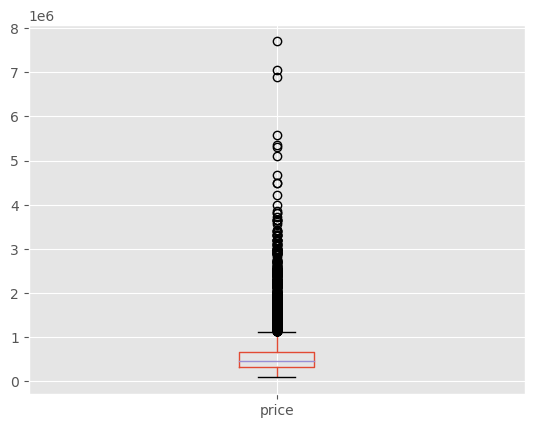

In [24]:
cln_data.boxplot(column=['price'])

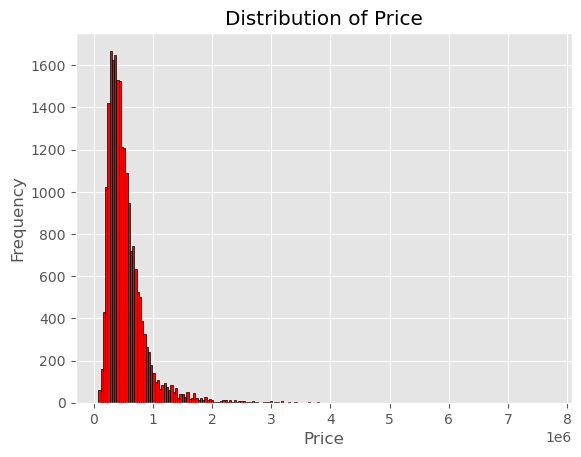

In [25]:
plt.hist(cln_data['price'], bins=200, color='red', edgecolor='black')

plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of Price')
 
plt.show()

In [26]:
# price is heavily skewed with many outliers.
cln_data = cln_data[np.abs(stats.zscore(cln_data['price'])) < 3]

<Axes: >

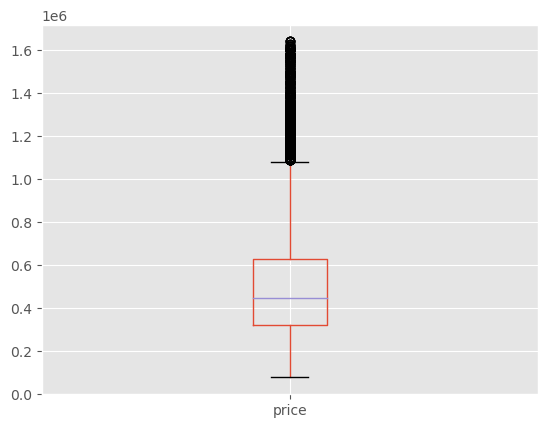

In [27]:
cln_data.boxplot(column=['price'])

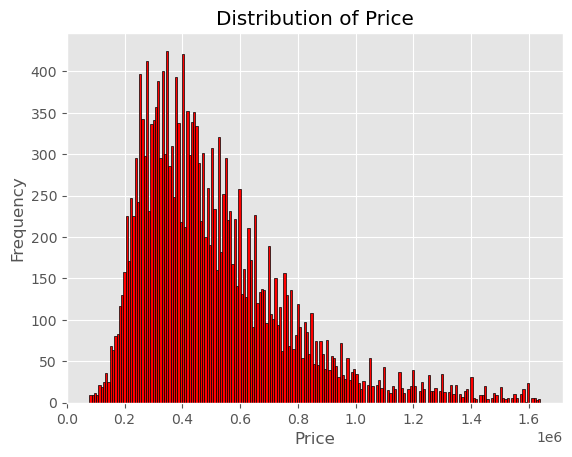

In [28]:
plt.hist(cln_data['price'], bins=200, color='red', edgecolor='black')

plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of Price')
 
plt.show()

In [29]:
#price is still heavilly skewed and doesnt follow a normal distribution, this will need to be normalised.

<Axes: >

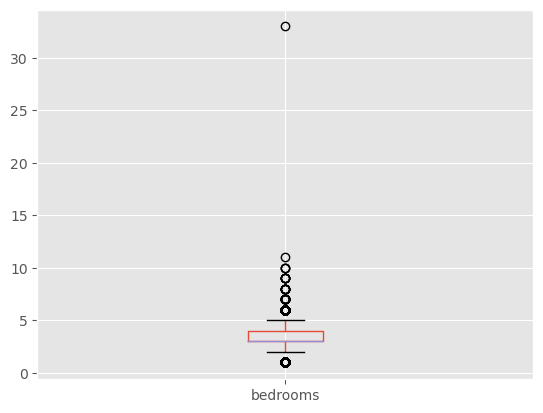

In [30]:
cln_data.boxplot(column=['bedrooms'])

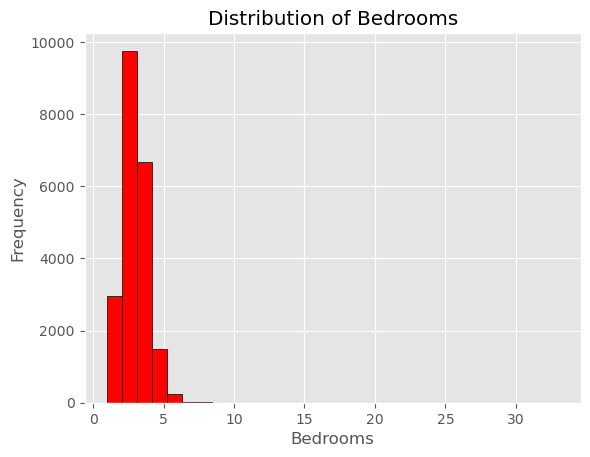

In [31]:
plt.hist(cln_data['bedrooms'], bins=30, color='red', edgecolor='black')
 
plt.xlabel('Bedrooms')
plt.ylabel('Frequency')
plt.title('Distribution of Bedrooms')
 
plt.show()

In [32]:
# bedrooms is heavily skewed with many outliers.
cln_data = cln_data[np.abs(stats.zscore(cln_data['bedrooms'])) < 3]

<Axes: >

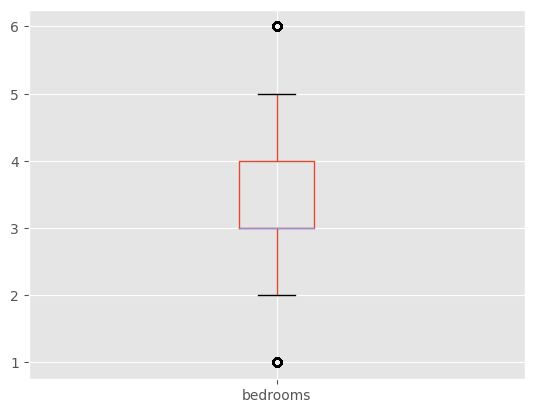

In [33]:
cln_data.boxplot(column=['bedrooms'])

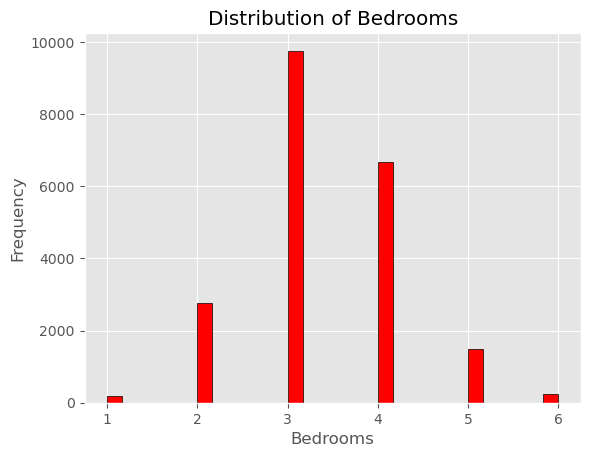

In [34]:
plt.hist(cln_data['bedrooms'], bins=30, color='red', edgecolor='black')
 
plt.xlabel('Bedrooms')
plt.ylabel('Frequency')
plt.title('Distribution of Bedrooms')
 
plt.show()

In [35]:
# This now has a normal distribution

<Axes: >

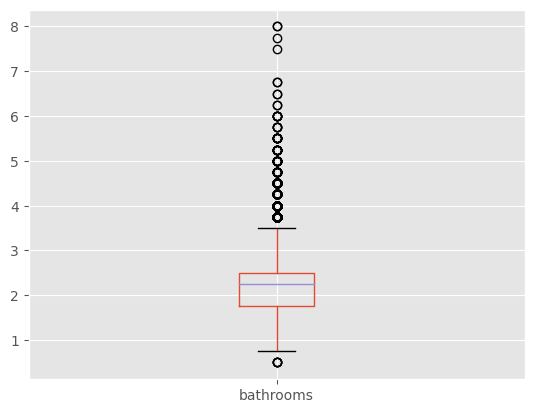

In [36]:
data.boxplot(column=['bathrooms'])

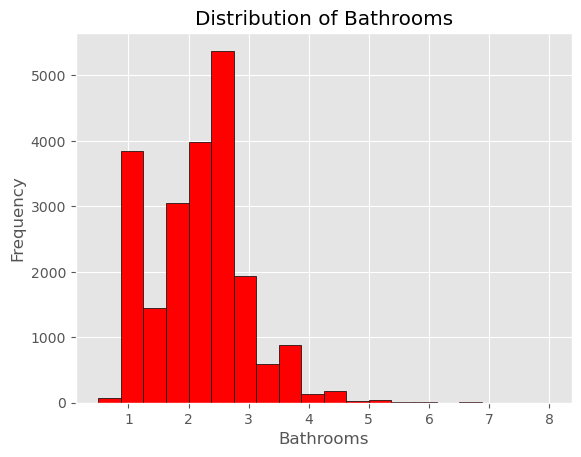

In [37]:
plt.hist(data['bathrooms'], bins=20, color='red', edgecolor='black')
 
plt.xlabel('Bathrooms')
plt.ylabel('Frequency')
plt.title('Distribution of Bathrooms')
 
plt.show()

In [38]:
# bathrooms is heavily skewed with many outliers.
cln_data = cln_data[np.abs(stats.zscore(cln_data['bathrooms'])) < 3]

<Axes: >

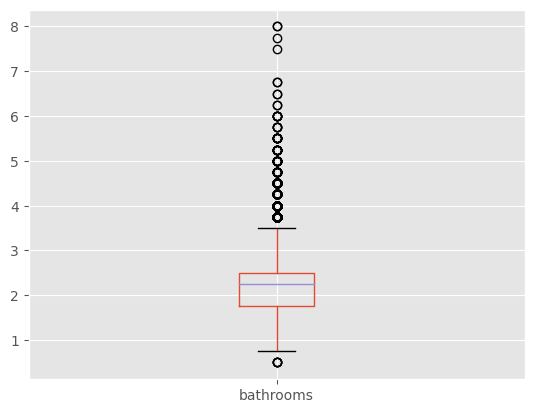

In [39]:
data.boxplot(column=['bathrooms'])

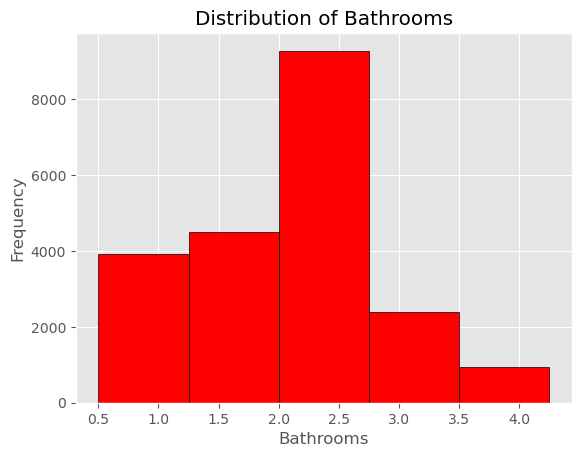

In [40]:
plt.hist(cln_data['bathrooms'], bins=5, color='red', edgecolor='black')
 
plt.xlabel('Bathrooms')
plt.ylabel('Frequency')
plt.title('Distribution of Bathrooms')
 
plt.show()


In [41]:
# bathrooms is still skewed but has a mostly normal distribution pattern

<Axes: >

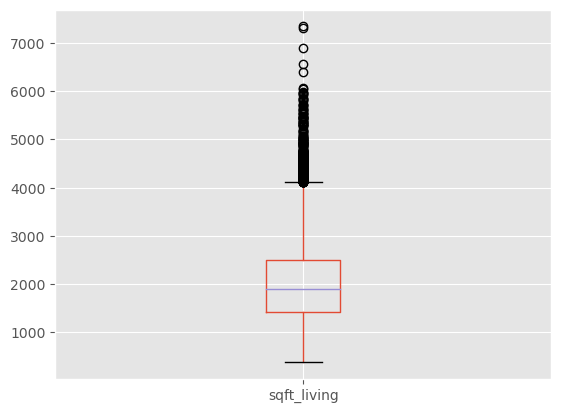

In [42]:
cln_data.boxplot(column=['sqft_living'])

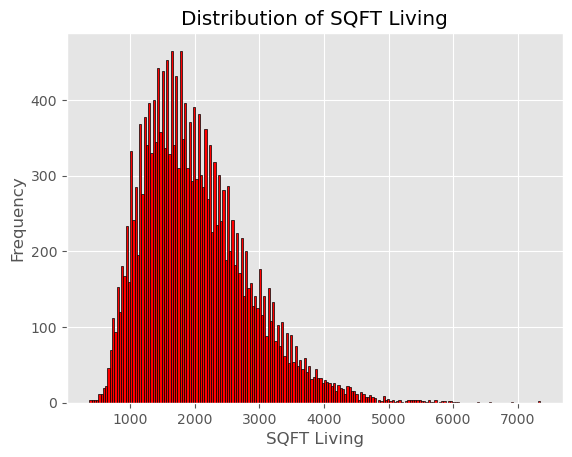

In [43]:
plt.hist(cln_data['sqft_living'], bins=200, color='red', edgecolor='black')
 
plt.xlabel('SQFT Living')
plt.ylabel('Frequency')
plt.title('Distribution of SQFT Living')
 
plt.show()

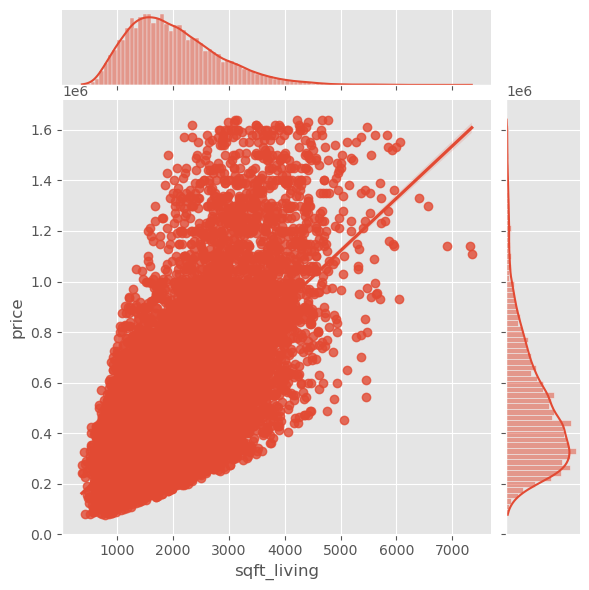

In [44]:
sns.jointplot(data = cln_data, x= 'sqft_living', y ='price', kind='reg')

In [45]:
#Sqft living follows a mostly normal distribution pattern but may need to be normalised

<Axes: >

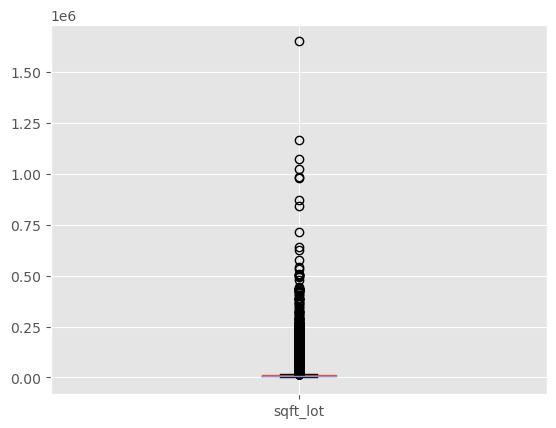

In [46]:
cln_data.boxplot(column=['sqft_lot'])

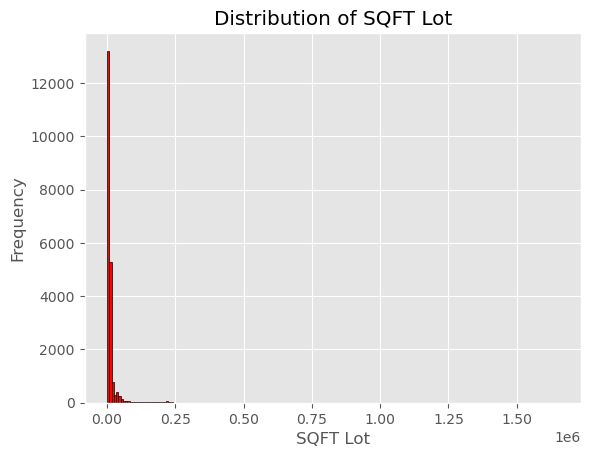

In [47]:
plt.hist(cln_data['sqft_lot'], bins=200, color='red', edgecolor='black')
 
plt.xlabel('SQFT Lot')
plt.ylabel('Frequency')
plt.title('Distribution of SQFT Lot')
 
plt.show()

In [48]:
#Sqft lot is heavinly skewed to the left with out a normal distribution. Will remove outliers to try to repair
cln_data = cln_data[np.abs(stats.zscore(cln_data['sqft_lot'])) < 3]

<Axes: >

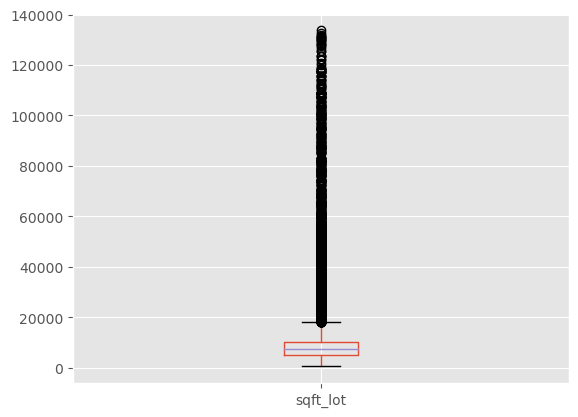

In [49]:
cln_data.boxplot(column=['sqft_lot'])

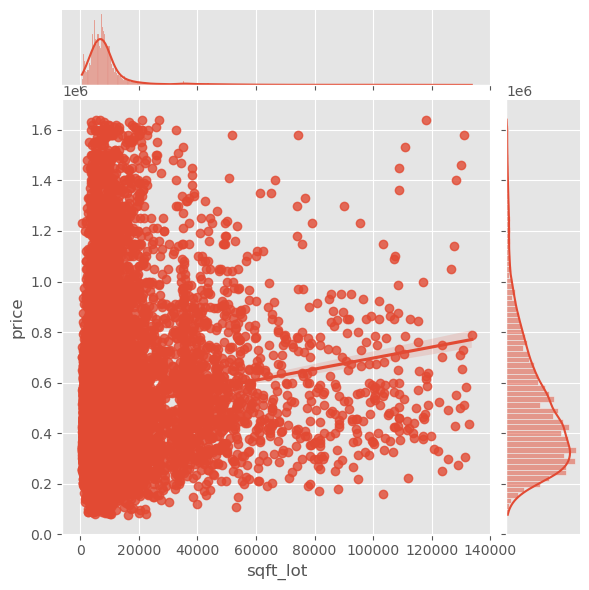

In [50]:
sns.jointplot(data = cln_data, x= 'sqft_lot', y ='price', kind='reg')

C:\Users\p_ste\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


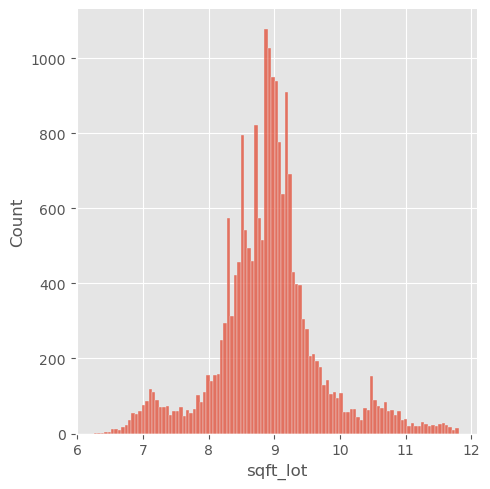

In [51]:
# with outliers removed the lot is still heavily skewed to the left but does follow a mostly normal distribution. 
# will normalise to see if this resolves the issue

test = cln_data
test.sqft_lot = np.log(test.sqft_lot)
sns.displot(cln_data.sqft_lot)

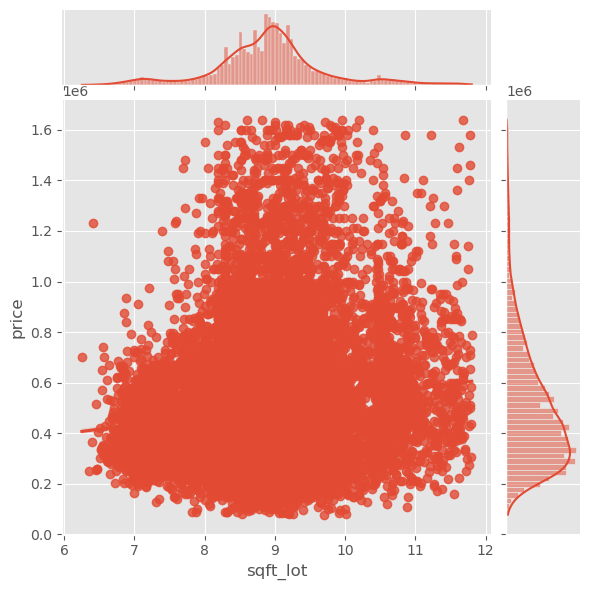

In [52]:
sns.jointplot(data = test, x= 'sqft_lot', y ='price', kind='reg')

In [53]:
# although normalising the data has repaired the distribution, there is no linearity

In [54]:
# Create Renovated column 
cln_data['yr_renovated'].fillna(0, inplace= True)
cln_data['renovated'] = cln_data.apply(lambda row: 0 if row['yr_renovated'] == 0 else 1, axis = 1)

In [55]:
# Create has basement column
cln_data['has_basement'] = cln_data.apply(lambda row: 0 if row['sqft_basement'] == 0 else 1, axis = 1)

In [56]:
#Check data is ready for analysis
cln_data.isna().sum()

price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
age              0
month_sold       0
year_sold        0
renovated        0
has_basement     0
dtype: int64

In [57]:
cln_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20708 entries, 0 to 21596
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          20708 non-null  float64
 1   bedrooms       20708 non-null  int64  
 2   bathrooms      20708 non-null  float64
 3   sqft_living    20708 non-null  int64  
 4   sqft_lot       20708 non-null  float64
 5   floors         20708 non-null  float64
 6   waterfront     20708 non-null  float64
 7   condition      20708 non-null  int64  
 8   grade          20708 non-null  int64  
 9   sqft_above     20708 non-null  int64  
 10  sqft_basement  20708 non-null  float64
 11  yr_renovated   20708 non-null  float64
 12  zipcode        20708 non-null  int64  
 13  lat            20708 non-null  float64
 14  long           20708 non-null  float64
 15  sqft_living15  20708 non-null  int64  
 16  sqft_lot15     20708 non-null  int64  
 17  age            20708 non-null  int64  
 18  month_sold 

In [58]:
cln_data.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,...,zipcode,lat,long,sqft_living15,sqft_lot15,age,month_sold,year_sold,renovated,has_basement
count,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,...,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000,20708.0000
mean,502665.2815,3.3366,2.0670,2007.5097,8.9185,1.4829,0.0037,3.4114,7.5869,1728.6286,...,98078.8711,47.5601,-122.2168,1949.1718,10355.6074,45.3083,6.5763,2014.3226,0.0323,0.3812
std,256562.1238,0.8623,0.7082,807.4365,0.7894,0.5386,0.0605,0.6500,1.0924,746.7524,...,53.5633,0.1387,0.1390,647.2110,15852.4911,29.3296,3.1126,0.4675,0.1767,0.4857
min,78000.0000,1.0000,0.5000,370.0000,6.2538,1.0000,0.0000,1.0000,3.0000,370.0000,...,98001.0000,47.1559,-122.5120,399.0000,651.0000,1.0000,1.0000,2014.0000,0.0000,0.0000
25%,317718.7500,3.0000,1.5000,1410.0000,8.5172,1.0000,0.0000,3.0000,7.0000,1180.0000,...,98033.0000,47.4706,-122.3310,1470.0000,5040.0000,20.0000,4.0000,2014.0000,0.0000,0.0000
50%,442507.5000,3.0000,2.2500,1880.0000,8.9227,1.0000,0.0000,3.0000,7.0000,1530.0000,...,98070.0000,47.5707,-122.2360,1820.0000,7515.0000,42.0000,6.0000,2014.0000,0.0000,0.0000
75%,625000.0000,4.0000,2.5000,2480.0000,9.2324,2.0000,0.0000,4.0000,8.0000,2130.0000,...,98118.0000,47.6791,-122.1280,2310.0000,9820.2500,65.0000,9.0000,2015.0000,0.0000,1.0000
max,1640000.0000,6.0000,4.2500,7350.0000,11.8036,3.5000,1.0000,5.0000,12.0000,5990.0000,...,98199.0000,47.7776,-121.3150,5790.0000,434728.0000,116.0000,12.0000,2015.0000,1.0000,1.0000


In [59]:
outcome = 'price'
x_cols = cln_data.drop("price", axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model1 = ols(formula=formula, data=cln_data).fit()
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.706
Model:                            OLS   Adj. R-squared:                  0.706
Method:                 Least Squares   F-statistic:                     2367.
Date:                Thu, 15 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:34:28   Log-Likelihood:            -2.7463e+05
No. Observations:               20708   AIC:                         5.493e+05
Df Residuals:                   20686   BIC:                         5.495e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -6.388e+07   7.04e+06     -9.071      0.000   -7.77e+07   -5.01e+07
bedrooms      -1.767e+04   1465.942    -12.053      0.000   -2.05e+04   -1.48e+04
bathrooms      2.702e+04   2442.478     11.062      0.000    2.22e+04    3.18e+04
sqft_living      97.5650     13.220      7.380      0.000      71.654     123.476
sqft_lot      -2.659e+04   2040.126    -13.035      0.000   -3.06e+04   -2.26e+04
floors         1.592e+04   2909.965      5.469      0.000    1.02e+04    2.16e+04
waterfront     3.714e+05   1.62e+04     22.932      0.000     3.4e+05    4.03e+05
condition      3.051e+04   1665.708     18.318      0.000    2.72e+04    3.38e+04
grade          8.905e+04   1560.614     57.062      0.000     8.6e+04    9.21e+04
sqft_above        9.6498     13.218      0.730      0.465     -16.258      35.558
sqft_basement    -1.9553     13.733     -0.142      0.887     -28.873      24.963
yr_renovated   2626.7869    338.376      7.763      0.000    1963.544    3290.030
zipcode        -320.3496     23.249    -13.779      0.000    -365.920    -274.779
lat            5.452e+05   7591.094     71.821      0.000     5.3e+05     5.6e+05
long          -9.017e+04   9533.708     -9.458      0.000   -1.09e+05   -7.15e+04
sqft_living15    63.3487      2.591     24.454      0.000      58.271      68.426
sqft_lot15        0.2755      0.078      3.511      0.000       0.122       0.429
age            2359.9799     51.488     45.835      0.000    2259.059    2460.901
month_sold      624.4202    499.586      1.250      0.211    -354.808    1603.648
year_sold      2.871e+04   3332.797      8.614      0.000    2.22e+04    3.52e+04
renovated     -5.196e+06   6.75e+05     -7.694      0.000   -6.52e+06   -3.87e+06
has_basement   1.249e+04   3864.942      3.231      0.001    4910.726    2.01e+04
==============================================================================
Omnibus:                     4960.271   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18798.978
Skew:                           1.159   Prob(JB):                         0.00
Kurtosis:                       7.051   Cond. No.                     7.19e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.19e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<Figure size 1200x800 with 0 Axes>

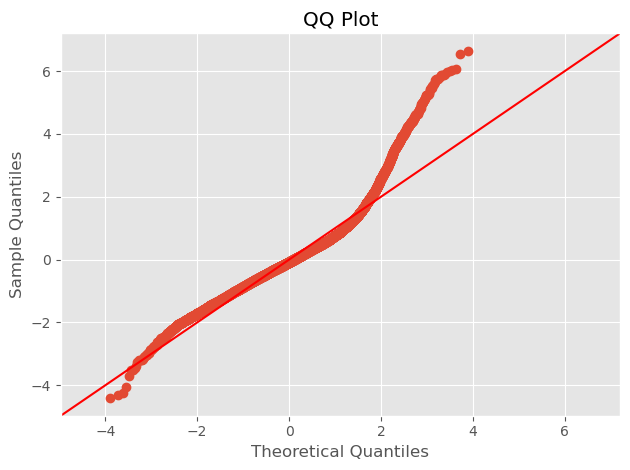

In [60]:
plt.figure(figsize=(12, 8))
fig = sm.graphics.qqplot(model1.resid, dist=stats.norm, line='45', fit=True)
plt.title('QQ Plot')
plt.tight_layout()
plt.show()

In [61]:
# Notes from 1st iteration
# 1. some features are significant to the price, p > .05 for many variables
# 2. the condition number is very large indicating there may be some multicolinarity
# 3. residuals are somewhat normal but will compare with the next interation

In [62]:
# Review price vs single features, check for linearity and multicolinarity create new df for next model

In [63]:
m2 = cln_data

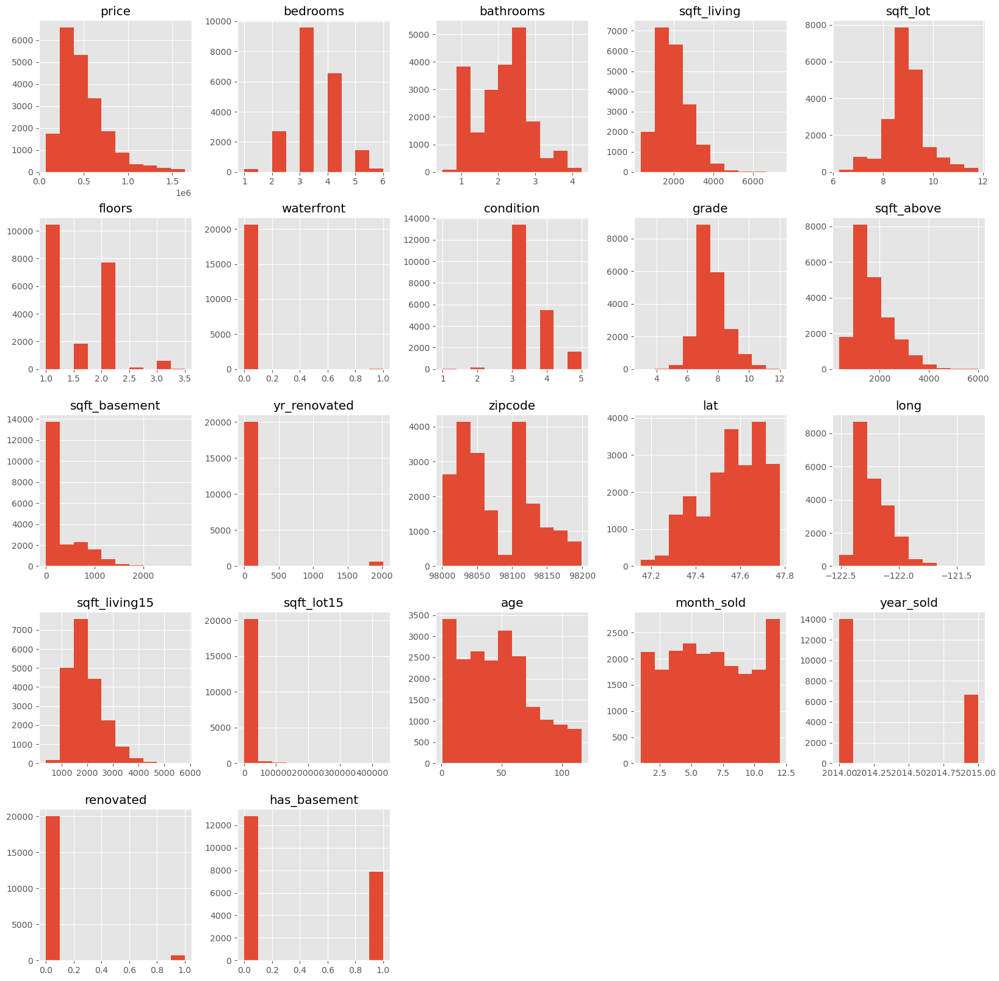

In [64]:
m2.hist(figsize=(20,20));

<Axes: xlabel='bedrooms', ylabel='price'>

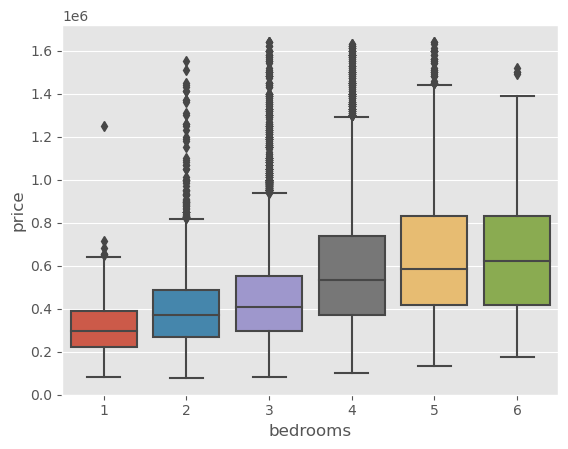

In [65]:
sns.boxplot(x='bedrooms', y='price', data=m2)

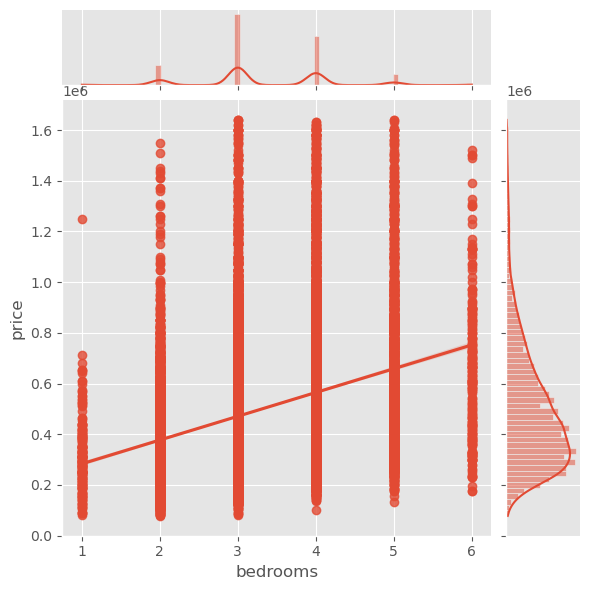

In [66]:
sns.jointplot(data = test, x= 'bedrooms', y ='price', kind='reg')

<Axes: xlabel='bedrooms', ylabel='price'>

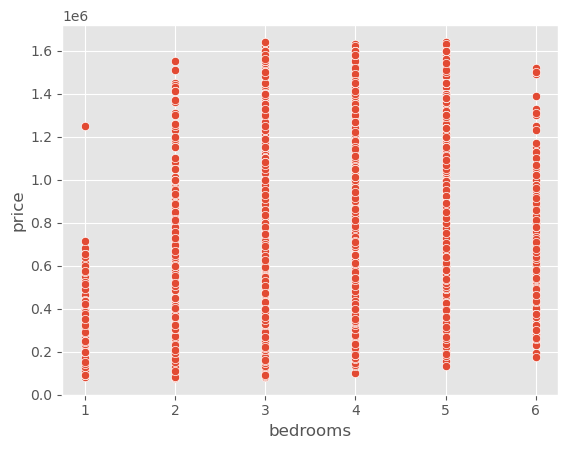

In [67]:
sns.scatterplot(x='bedrooms', y='price', data=m2)

In [68]:
# bedrooms are a categorical value

<Axes: xlabel='bathrooms', ylabel='price'>

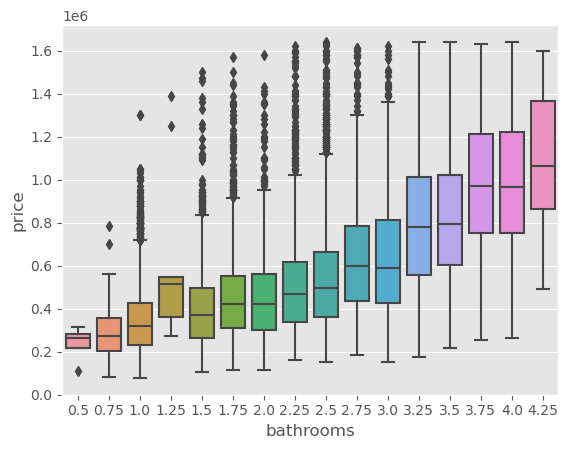

In [69]:
sns.boxplot(x='bathrooms', y='price', data=m2)

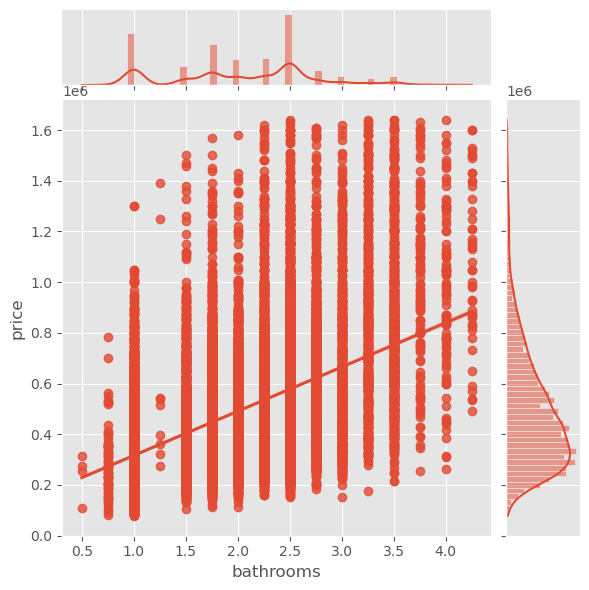

In [70]:
sns.jointplot(data = test, x= 'bathrooms', y ='price', kind='reg')

In [71]:
# bathrooms are a categorical value

<Axes: xlabel='sqft_living', ylabel='price'>

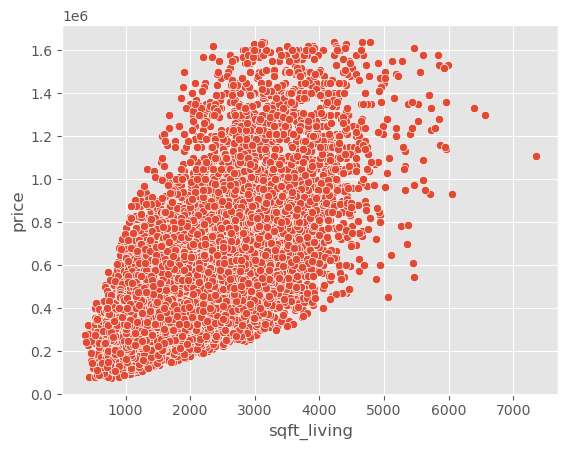

In [72]:
sns.scatterplot(x='sqft_living', y='price', data=m2)

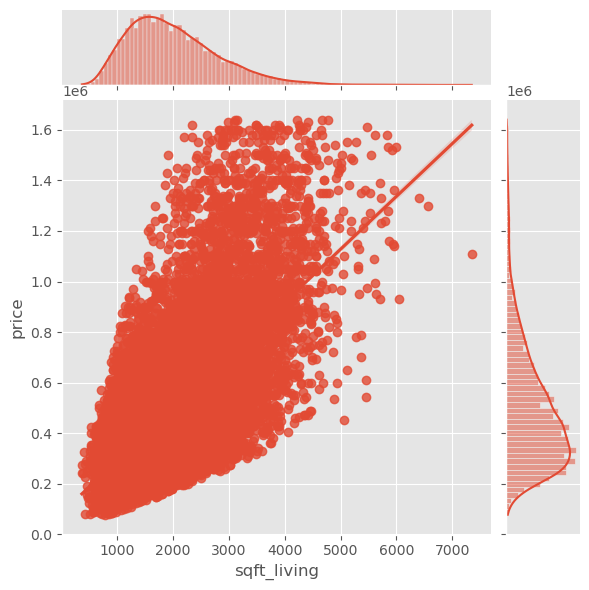

In [73]:
sns.jointplot(data = test, x= 'sqft_living', y ='price', kind='reg')

In [74]:
# sqft_living is a variable factor with a linear relationship

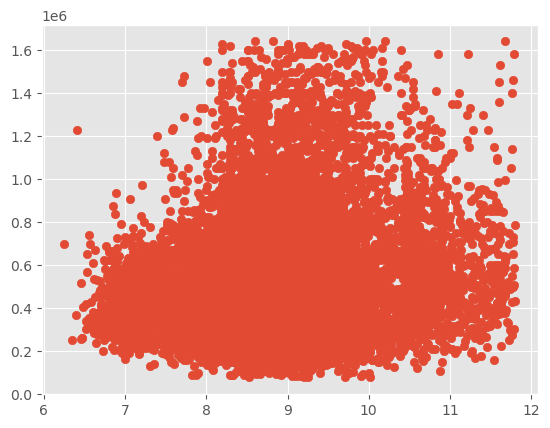

In [75]:
plt.scatter(m2.sqft_lot, m2.price)

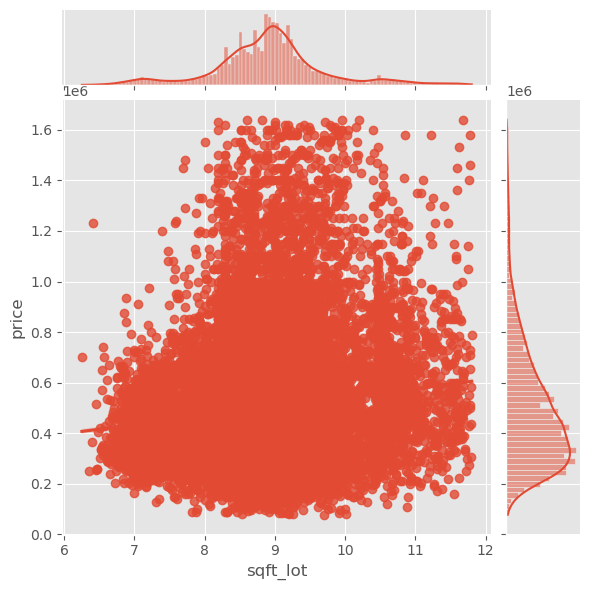

In [76]:
sns.jointplot(data = test, x= 'sqft_lot', y ='price', kind='reg')

In [77]:
# sqft_lot has a very limited relationship to price and we will have to drop. 
m2.drop(columns=['sqft_lot'], inplace=True)

<Axes: xlabel='floors', ylabel='price'>

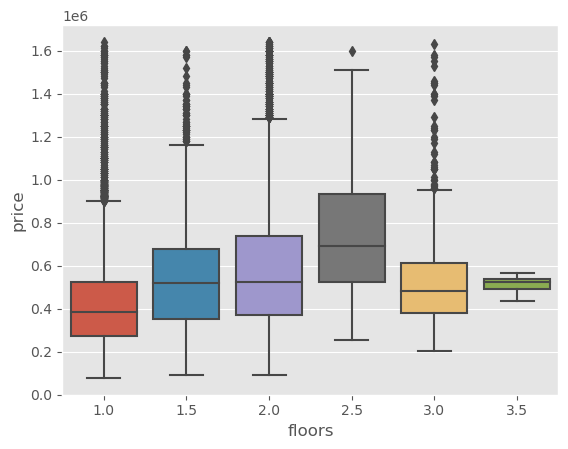

In [78]:
sns.boxplot(x='floors', y='price', data=m2)

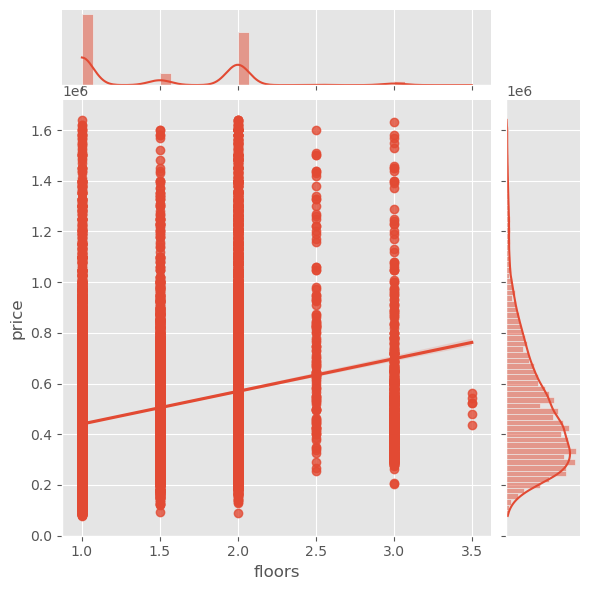

In [79]:
sns.jointplot(data = test, x= 'floors', y ='price', kind='reg')

<Axes: xlabel='waterfront', ylabel='price'>

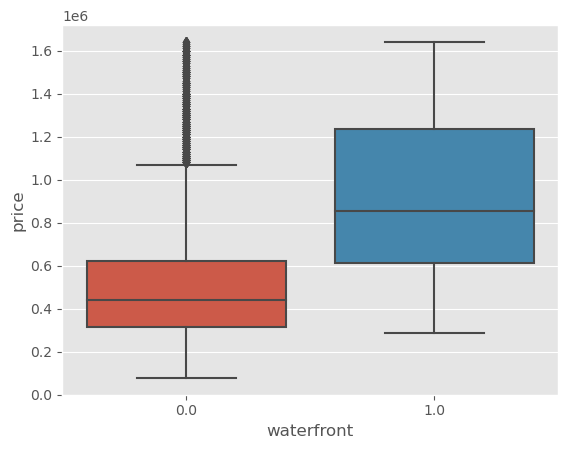

In [80]:
sns.boxplot(x='waterfront', y='price', data=m2)

<Axes: xlabel='condition', ylabel='price'>

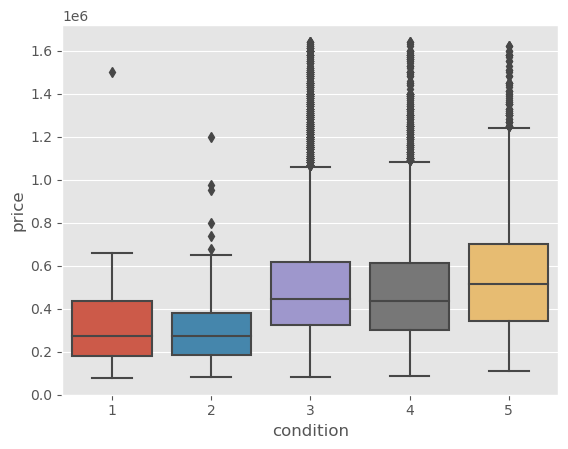

In [81]:
sns.boxplot(x='condition', y='price', data=m2)

<Axes: xlabel='grade', ylabel='price'>

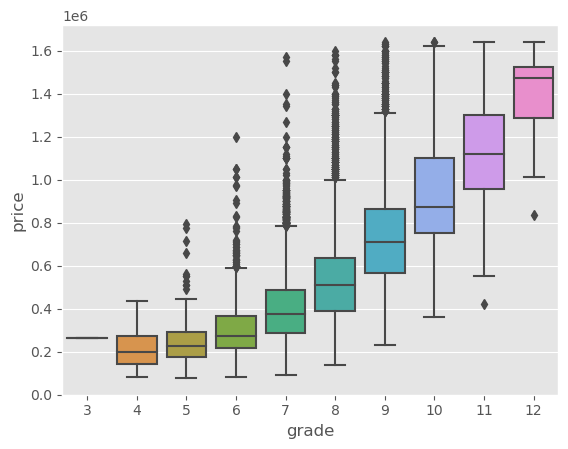

In [82]:
sns.boxplot(x='grade', y='price', data=m2)

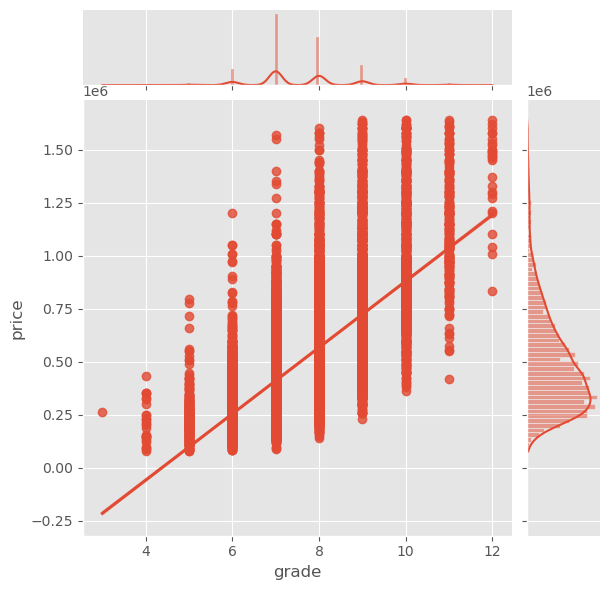

In [83]:
sns.jointplot(data = test, x= 'grade', y ='price', kind='reg')

<Axes: xlabel='yr_renovated', ylabel='price'>

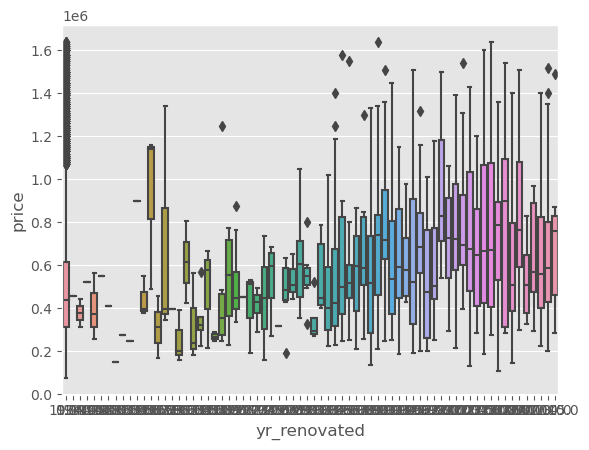

In [84]:
sns.boxplot(x='yr_renovated', y='price', data=m2)

<Axes: xlabel='yr_renovated'>

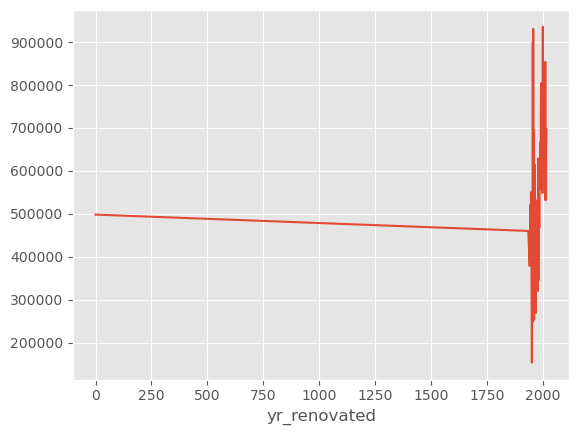

In [85]:
m2.groupby(['yr_renovated'])['price'].mean().plot()

<Axes: xlabel='zipcode', ylabel='price'>

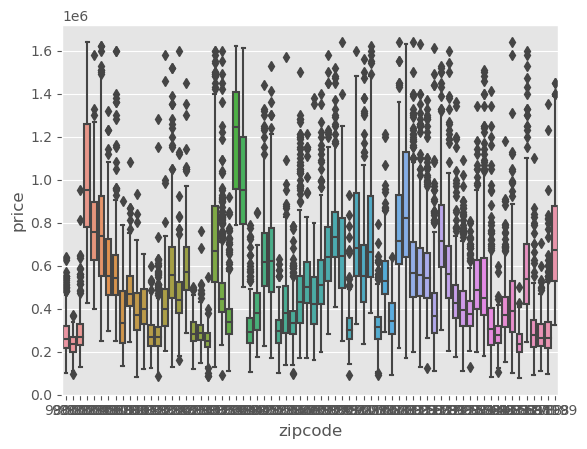

In [86]:
sns.boxplot(x='zipcode', y='price', data=m2)

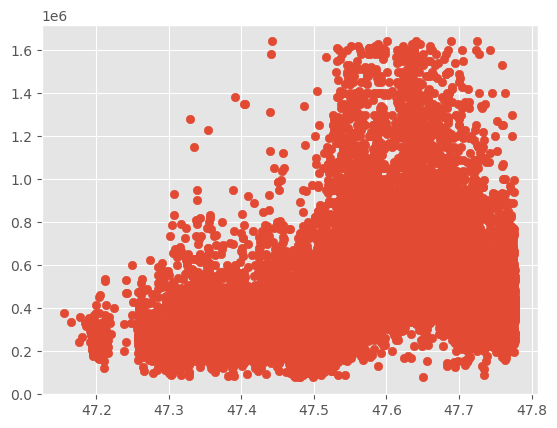

In [87]:
plt.scatter(m2.lat, m2.price)

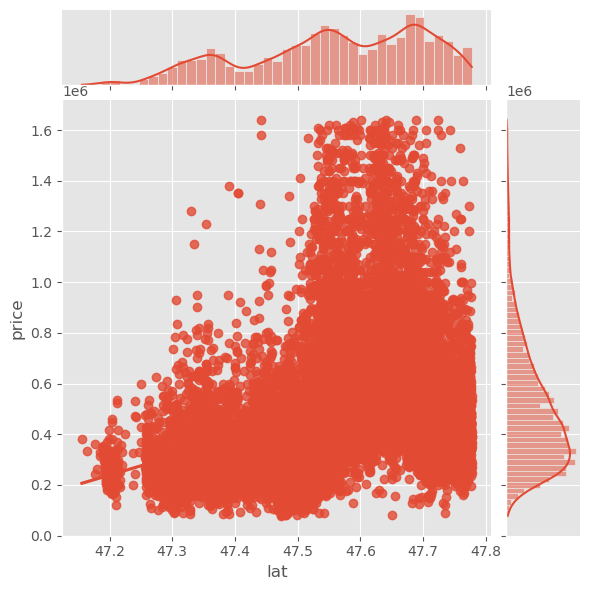

In [88]:
sns.jointplot(data = test, x= 'lat', y ='price', kind='reg')

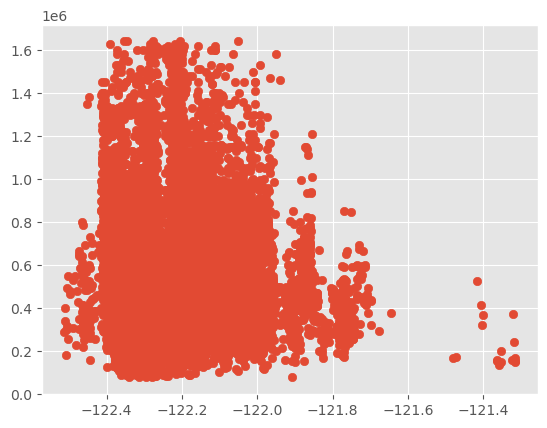

In [89]:
plt.scatter(m2.long, m2.price)

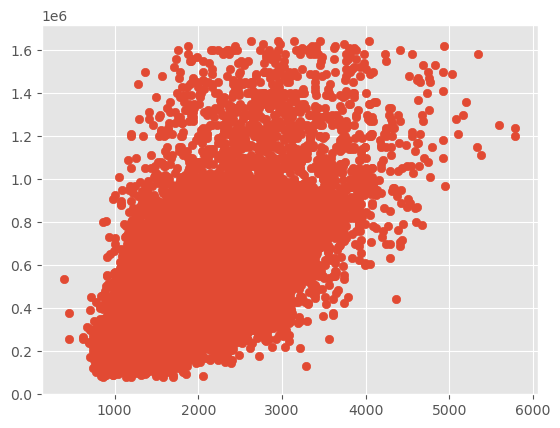

In [90]:
plt.scatter(m2.sqft_living15, m2.price)

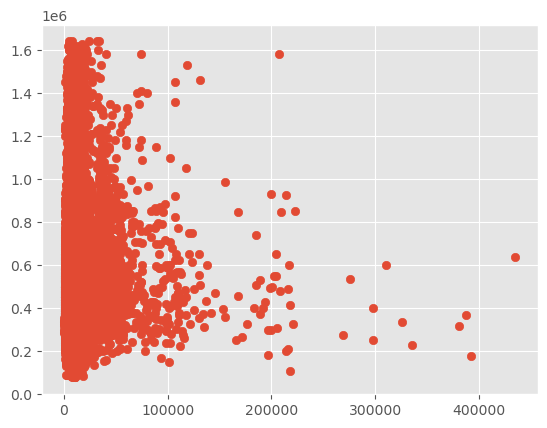

In [91]:
plt.scatter(m2.sqft_lot15, m2.price)

<Axes: xlabel='age', ylabel='price'>

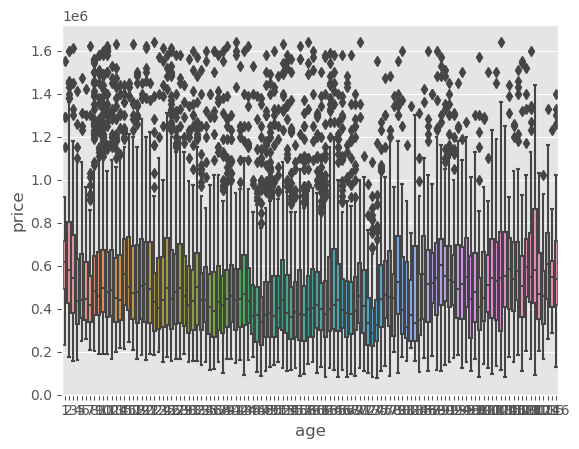

In [92]:
sns.boxplot(x='age', y='price', data=m2)

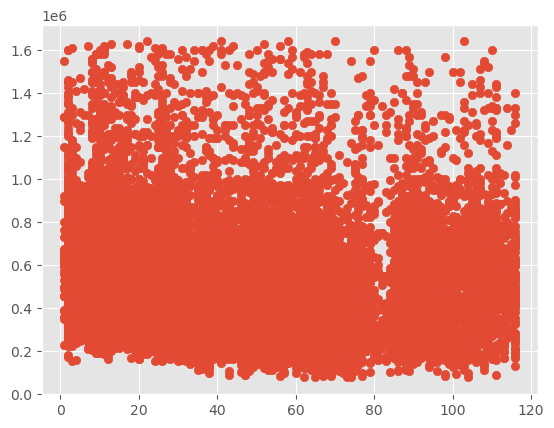

In [93]:
plt.scatter(m2.age, m2.price)

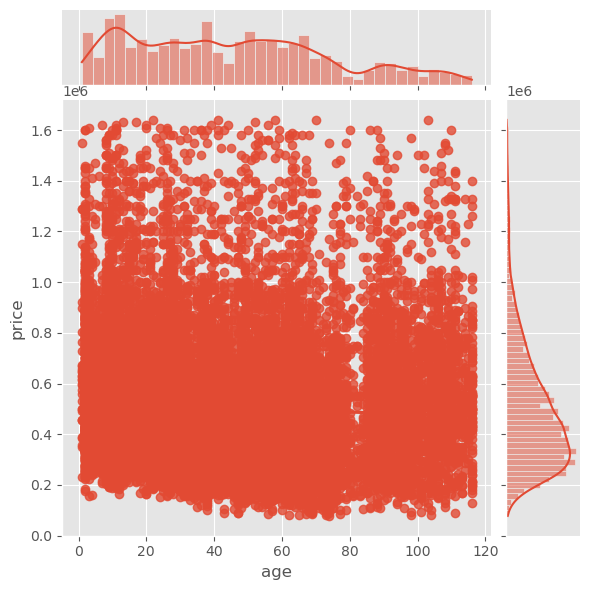

In [94]:
sns.jointplot(data = test, x= 'age', y ='price', kind='reg')

<Axes: xlabel='month_sold', ylabel='price'>

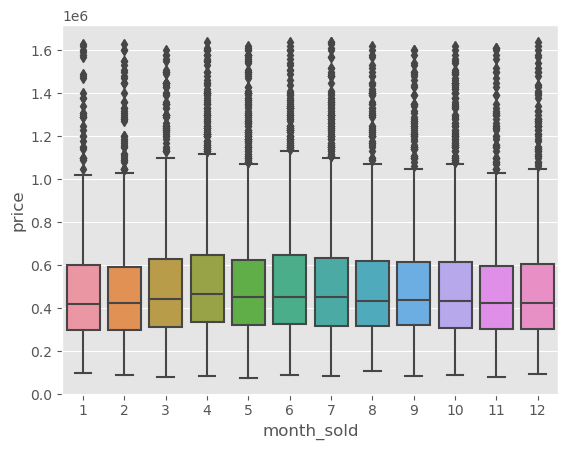

In [95]:
sns.boxplot(x='month_sold', y='price', data=m2)

<Axes: xlabel='month_sold'>

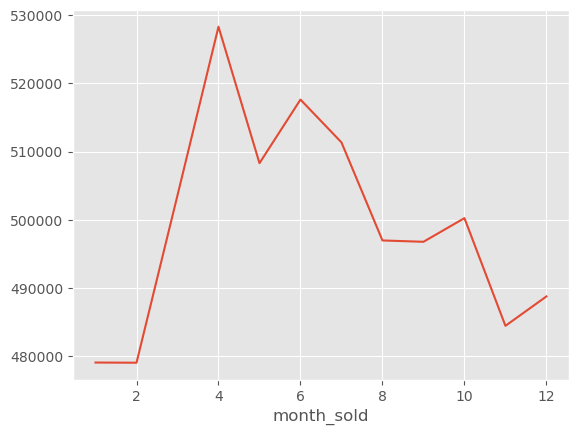

In [96]:
m2.groupby(['month_sold'])['price'].mean().plot()

<Axes: xlabel='year_sold', ylabel='price'>

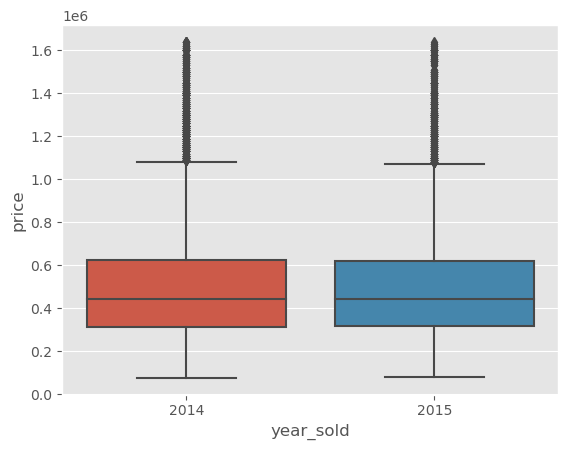

In [97]:
sns.boxplot(x='year_sold', y='price', data=m2)

<Axes: xlabel='year_sold'>

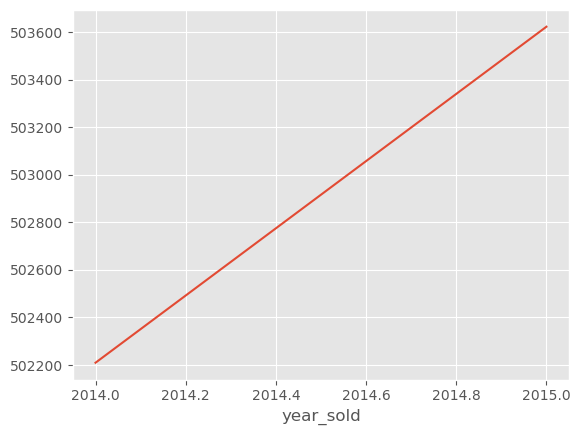

In [98]:
m2.groupby(['year_sold'])['price'].mean().plot()

<Axes: xlabel='renovated', ylabel='price'>

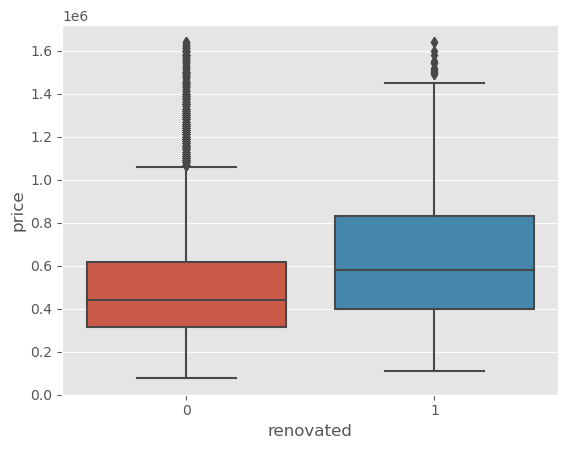

In [99]:
sns.boxplot(x='renovated', y='price', data=m2)

<Axes: xlabel='renovated'>

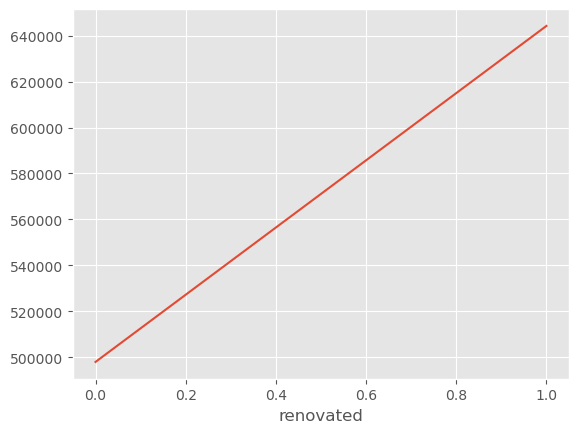

In [100]:
m2.groupby(['renovated'])['price'].mean().plot()

<Axes: xlabel='age'>

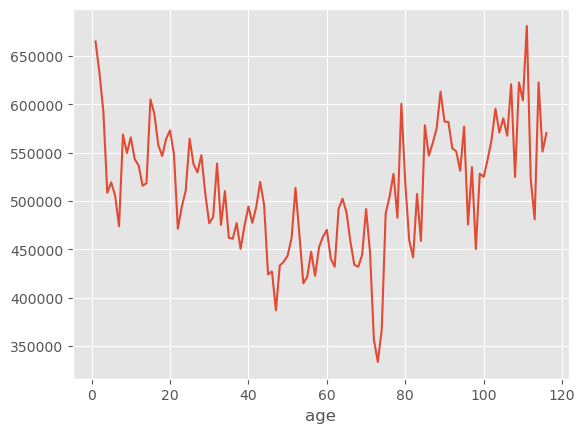

In [101]:
m2.groupby(['age'])['price'].mean().plot()

In [102]:
# Investigate Multicollinearity assumption

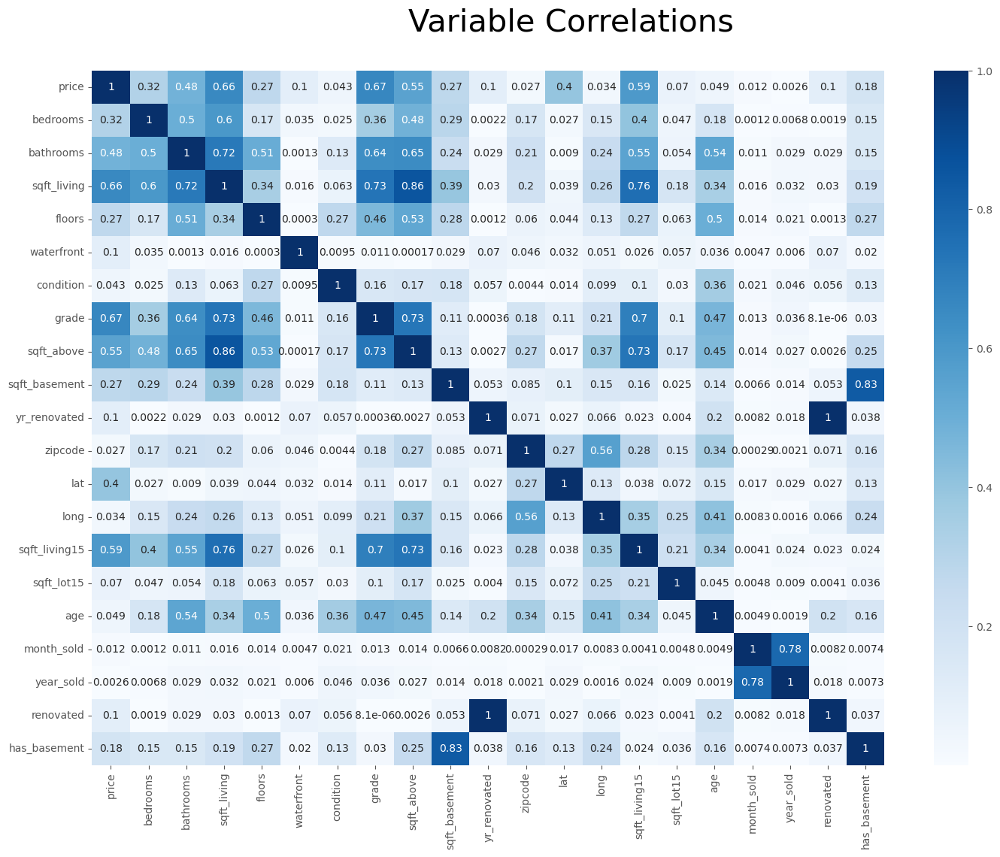

In [103]:
corr = m2.select_dtypes('number').corr().abs()
fig, ax=plt.subplots(figsize=(17,12))
fig.suptitle('Variable Correlations', fontsize=30, y=.95)
heatmap = sns.heatmap(corr, cmap='Blues', annot=True)

In [104]:
print(corr['price'])

price           1.0000
bedrooms        0.3151
bathrooms       0.4817
sqft_living     0.6572
floors          0.2703
waterfront      0.0999
condition       0.0434
grade           0.6653
sqft_above      0.5541
sqft_basement   0.2739
yr_renovated    0.1011
zipcode         0.0274
lat             0.3959
long            0.0336
sqft_living15   0.5899
sqft_lot15      0.0700
age             0.0494
month_sold      0.0119
year_sold       0.0026
renovated       0.1008
has_basement    0.1817
Name: price, dtype: float64


In [105]:
features = []
correlations = []
for idx, correlation in corr['price'].T.items():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_with_price = pd.DataFrame({'Correlations':correlations, 'Features': features})

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.items():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features})
print('Multicollinear Features')
display(MC_df)
print('Correlations with Price')
display(corr_with_price)

Multicollinear Features


,Correlations,Features
0,0.8564,"[sqft_living, sqft_above]"
1,0.8564,"[sqft_above, sqft_living]"
2,0.8332,"[sqft_basement, has_basement]"
3,1.0000,"[yr_renovated, renovated]"
4,1.0000,"[renovated, yr_renovated]"
5,0.8332,"[has_basement, sqft_basement]"


Correlations with Price


,Correlations,Features
0,0.3151,bedrooms
1,0.4817,bathrooms
2,0.6572,sqft_living
3,0.6653,grade
4,0.5541,sqft_above
5,0.3959,lat
6,0.5899,sqft_living15


In [106]:
## Grade has the highest correlation with 'price', followed by sqft_living, sqft_living15, sqft_above and bathrooms.
## Investigate geographical factors as it would be expected to have higher correlation on lat, long or zipcode

In [107]:
# sqft_above and sqft_living, sqft_basement and has_basement, and yr_renovated and renovated all have a high correlation 
# with each other, greater than .80, we will drop sqft_above and sqft_basement but I will further investigate the renovated data
m2.drop(columns=['sqft_above'],inplace=True)
m2.drop(columns=['sqft_basement'], inplace = True)

<Axes: title={'center': 'Home Location vs. Price'}, xlabel='long', ylabel='lat'>

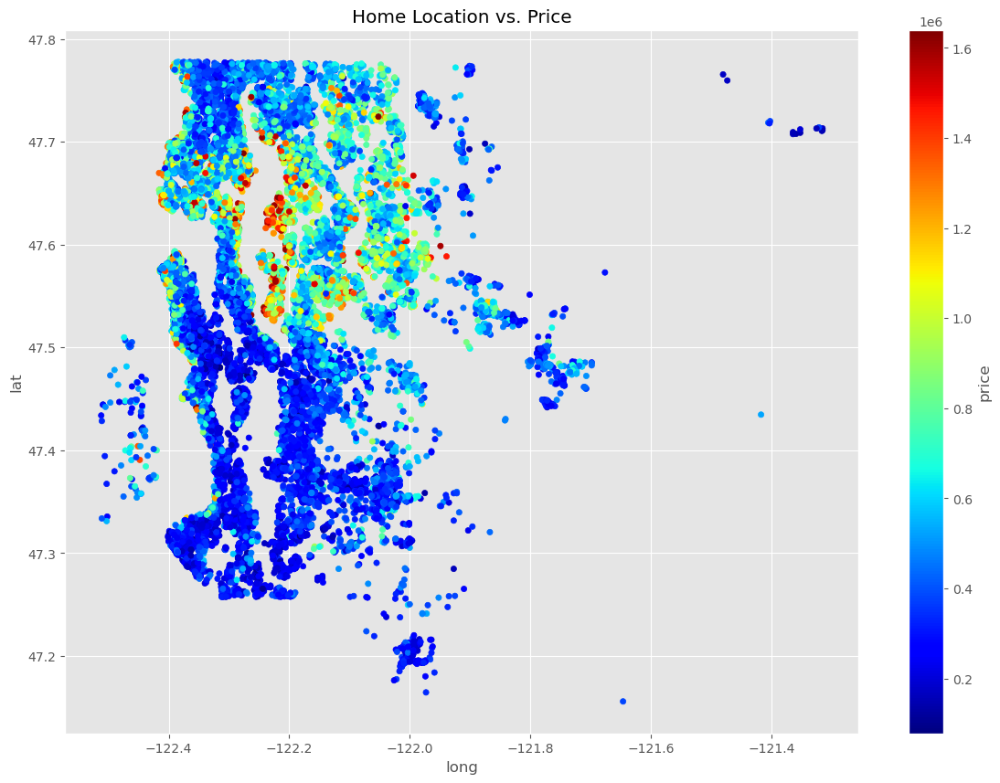

In [108]:
# Investigate geographical features as they should have more effect on price
# Plot location by price
m2.plot.scatter('long', 'lat', c='price', colormap='jet', figsize=(14, 10), title = 'Home Location vs. Price')

In [109]:
import plotly.express as px

In [110]:
color_scale = [(0, 'blue'), (1,'red')]

fig = px.scatter_mapbox(m2, 
                        lat="lat", 
                        lon="long", 
                        hover_name="price", 
                        hover_data=["price"],
                        color="price",
                        color_continuous_scale=color_scale,
                        zoom=10, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [111]:
## Investigation of King County shows that Seattle is its prominant city, located at (47.6062, -122.3321)
## and this appears to have a correlation with the house prices

In [112]:
#create column with distance to Seattle for comparison
from math import sqrt, radians, cos, sin, asin, sqrt

def haversine_np(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)
    
    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6378.137 * c
    return km

m2['distance'] = haversine_np(m2['long'],m2['lat'],-122.3321,47.6062)



In [113]:
m2.head()

,price,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,month_sold,year_sold,renovated,has_basement,distance
0,221900.0000,3,1.0000,1180,1.0000,0.0000,3,7,0.0000,98178,47.5112,-122.2570,1340,5650,61,10,2014,0,0,11.9861
1,538000.0000,3,2.2500,2570,2.0000,0.0000,3,7,1991.0000,98125,47.7210,-122.3190,1690,7639,65,12,2014,1,1,12.8172
2,180000.0000,2,1.0000,770,1.0000,0.0000,3,6,0.0000,98028,47.7379,-122.2330,2720,8062,83,2,2015,0,0,16.4354
3,604000.0000,4,3.0000,1960,1.0000,0.0000,5,7,0.0000,98136,47.5208,-122.3930,1360,5000,51,12,2014,0,1,10.5500
4,510000.0000,3,2.0000,1680,1.0000,0.0000,3,8,0.0000,98074,47.6168,-122.0450,1800,7503,29,2,2015,0,0,21.5781


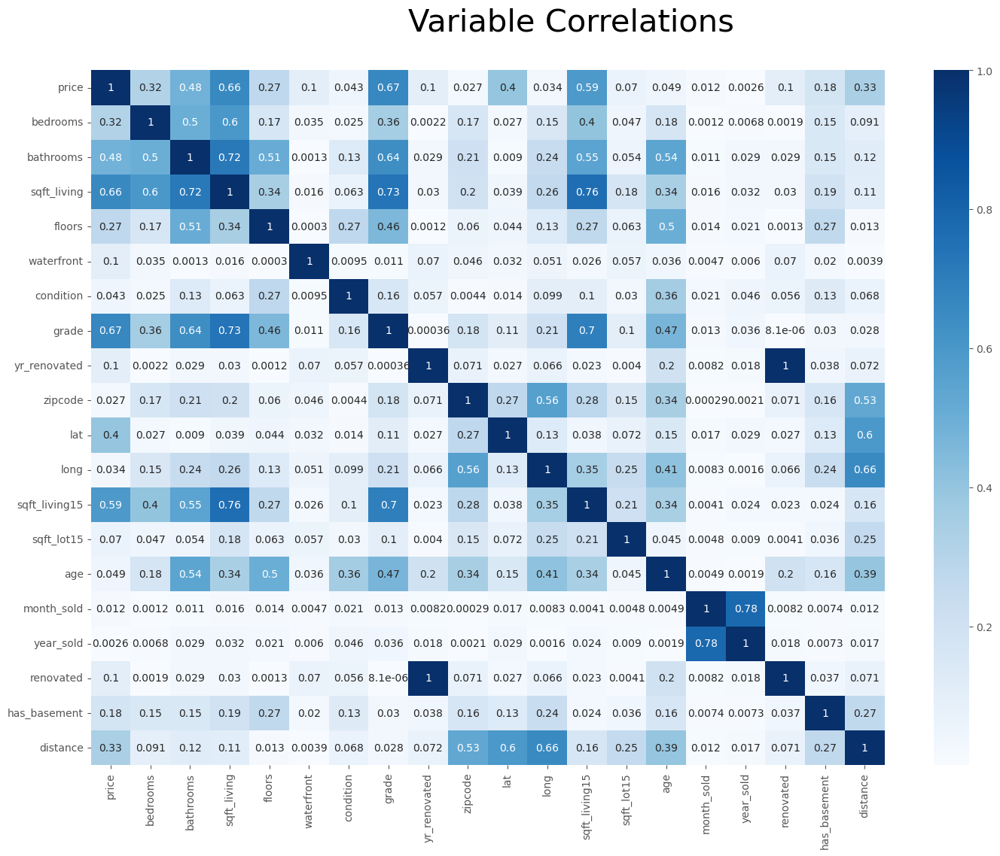

In [114]:
corr = m2.select_dtypes('number').corr().abs()
fig, ax=plt.subplots(figsize=(17,12))
fig.suptitle('Variable Correlations', fontsize=30, y=.95)
heatmap = sns.heatmap(corr, cmap='Blues', annot=True)

In [115]:
features = []
correlations = []
for idx, correlation in corr['price'].T.items():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_with_price = pd.DataFrame({'Correlations':correlations, 'Features': features})

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.items():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features})
print('Multicollinear Features')
display(MC_df)
print('Correlations with Price')
display(corr_with_price)

Multicollinear Features


,Correlations,Features
0,1.0000,"[yr_renovated, renovated]"
1,1.0000,"[renovated, yr_renovated]"


Correlations with Price


,Correlations,Features
0,0.3151,bedrooms
1,0.4817,bathrooms
2,0.6572,sqft_living
3,0.6653,grade
4,0.3959,lat
5,0.5899,sqft_living15
6,0.3346,distance


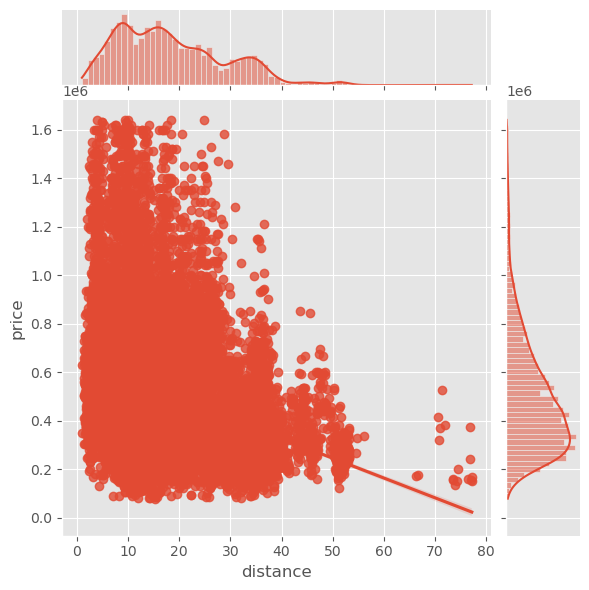

In [116]:
sns.jointplot(data = m2, x= 'distance', y ='price', kind='reg')

In [117]:
# what about zipcode, does this have a linear relationship if mapped out in order of mean price

In [118]:
## Zipcode convert to map to test for linearity
zipmap = m2.groupby(['zipcode'])['price'].mean()

In [119]:
zipmap = zipmap.sort_values(ascending = True)

In [120]:
zipmap = zipmap.reset_index()

In [121]:
zipmap.head()

,zipcode,price
0,98002,232604.7092
1,98168,238986.3134
2,98032,251296.2400
3,98001,279489.7989
4,98022,282715.5744


In [122]:
zipmap['map'] = np.arange(len(zipmap))

In [123]:
zipmap.head()

,zipcode,price,map
0,98002,232604.7092,0
1,98168,238986.3134,1
2,98032,251296.2400,2
3,98001,279489.7989,3
4,98022,282715.5744,4


In [124]:
zipcompare = pd.merge(m2, zipmap, on = ['zipcode'])

In [125]:
zipcompare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20708 entries, 0 to 20707
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price_x        20708 non-null  float64
 1   bedrooms       20708 non-null  int64  
 2   bathrooms      20708 non-null  float64
 3   sqft_living    20708 non-null  int64  
 4   floors         20708 non-null  float64
 5   waterfront     20708 non-null  float64
 6   condition      20708 non-null  int64  
 7   grade          20708 non-null  int64  
 8   yr_renovated   20708 non-null  float64
 9   zipcode        20708 non-null  int64  
 10  lat            20708 non-null  float64
 11  long           20708 non-null  float64
 12  sqft_living15  20708 non-null  int64  
 13  sqft_lot15     20708 non-null  int64  
 14  age            20708 non-null  int64  
 15  month_sold     20708 non-null  int64  
 16  year_sold      20708 non-null  int64  
 17  renovated      20708 non-null  int64  
 18  has_ba

In [126]:
zipcompare = zipcompare.rename(columns={'price_x': 'price'})

In [127]:
zipcompare.drop('price_y', axis=1, inplace=True)

In [128]:
m2 = zipcompare

<Axes: xlabel='map'>

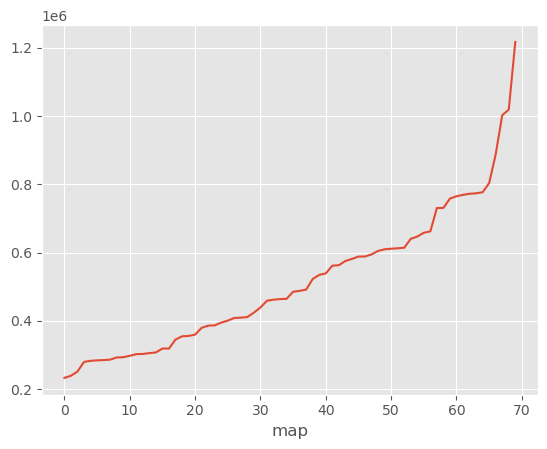

In [129]:
m2.groupby(['map'])['price'].mean().plot()

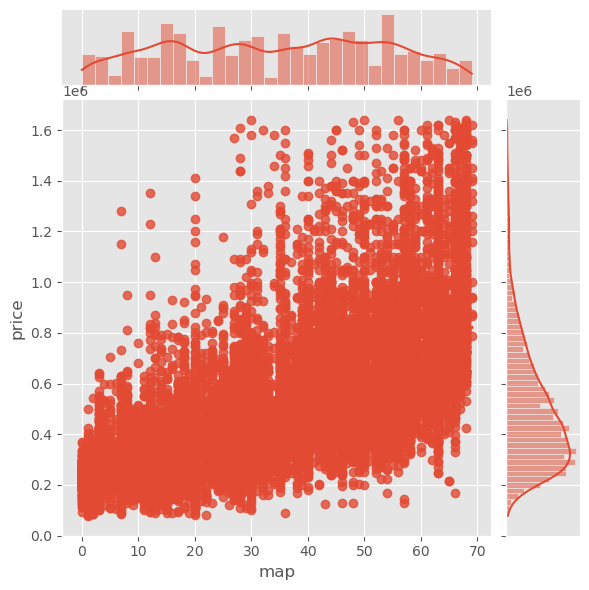

In [130]:
sns.jointplot(data = m2, x= 'map', y ='price', kind='reg')

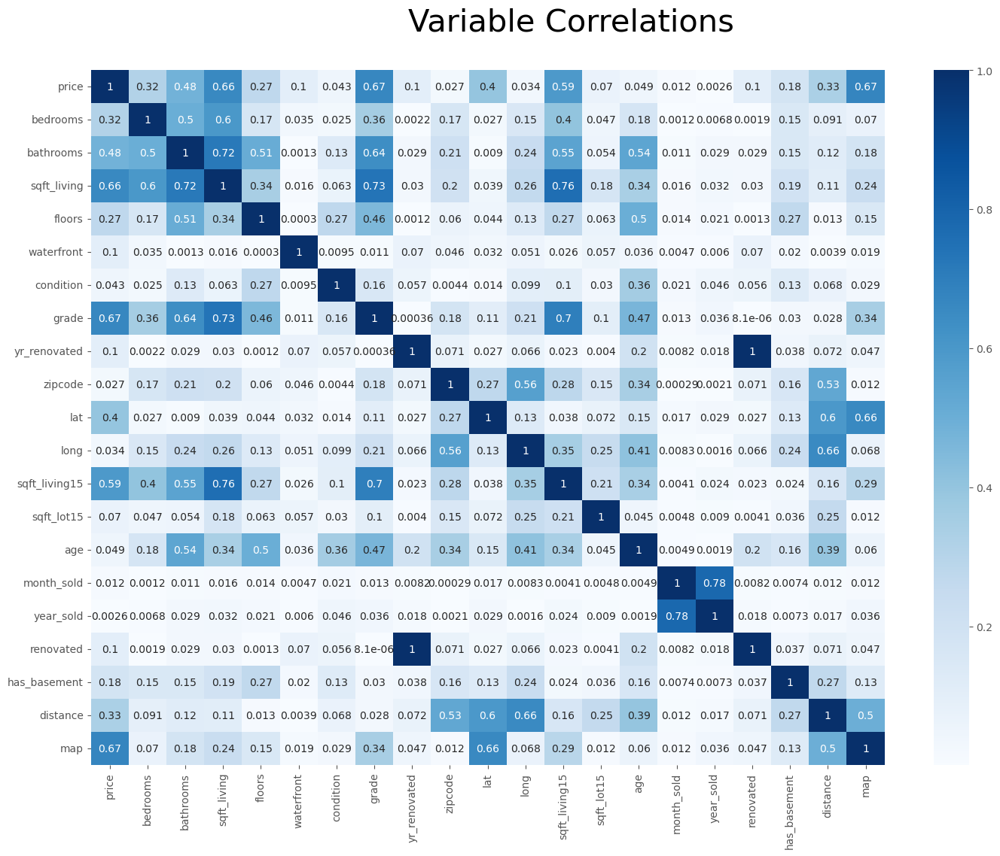

In [131]:
corr = m2.select_dtypes('number').corr().abs()
fig, ax=plt.subplots(figsize=(17,12))
fig.suptitle('Variable Correlations', fontsize=30, y=.95)
heatmap = sns.heatmap(corr, cmap='Blues', annot=True)

In [132]:
features = []
correlations = []
for idx, correlation in corr['price'].T.items():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_with_price = pd.DataFrame({'Correlations':correlations, 'Features': features})

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.items():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features})
print('Multicollinear Features')
display(MC_df)
print('Correlations with Price')
display(corr_with_price)

Multicollinear Features


,Correlations,Features
0,1.0000,"[yr_renovated, renovated]"
1,1.0000,"[renovated, yr_renovated]"


Correlations with Price


,Correlations,Features
0,0.3151,bedrooms
1,0.4817,bathrooms
2,0.6572,sqft_living
3,0.6653,grade
4,0.3959,lat
5,0.5899,sqft_living15
6,0.3346,distance
7,0.6722,map


In [133]:
# Given that the sales data is only over two years meadian price by zipcode is fairly accurate ranking
# Map has the highest correlation, followed by grade, sqft_living, sqft_living15, and bathrooms

In [134]:
#split renovated homes into its own df to check on price to renovation dates, possibly to group them into categories
ren_data = m2
ren_data = ren_data.loc[(ren_data[['renovated']] != 0).all(axis=1)]


#Convert yr_renovated to age_reno
ren_data['age_reno'] = 2016 - ren_data['yr_renovated']

C:\Users\p_ste\AppData\Local\Temp\ipykernel_4024\2311675973.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [135]:
#investigate renovated property data
ren_data.head()

,price,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,yr_renovated,zipcode,...,sqft_living15,sqft_lot15,age,month_sold,year_sold,renovated,has_basement,distance,map,age_reno
9,290900.0000,2,2.0000,1610,2.0000,0.0000,3,6,1983.0000,98178,...,1310,12950,86,6,2014,1,0,14.3249,13,33.0000
10,190000.0000,2,1.0000,630,1.0000,0.0000,3,6,2005.0000,98178,...,1470,6840,73,9,2014,1,0,14.7185,13,11.0000
39,210000.0000,3,1.0000,1200,1.0000,0.0000,3,6,1989.0000,98178,...,1010,7000,111,11,2014,1,0,13.4066,13,27.0000
67,1100000.0000,4,3.2500,3190,2.0000,1.0000,3,8,1991.0000,98178,...,2240,8725,60,7,2014,1,1,13.9983,13,25.0000
113,230000.0000,3,1.7500,1420,1.0000,0.0000,3,5,2014.0000,98178,...,1960,5000,85,10,2014,1,1,13.3571,13,2.0000


In [136]:
ren_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 668 entries, 9 to 20704
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          668 non-null    float64
 1   bedrooms       668 non-null    int64  
 2   bathrooms      668 non-null    float64
 3   sqft_living    668 non-null    int64  
 4   floors         668 non-null    float64
 5   waterfront     668 non-null    float64
 6   condition      668 non-null    int64  
 7   grade          668 non-null    int64  
 8   yr_renovated   668 non-null    float64
 9   zipcode        668 non-null    int64  
 10  lat            668 non-null    float64
 11  long           668 non-null    float64
 12  sqft_living15  668 non-null    int64  
 13  sqft_lot15     668 non-null    int64  
 14  age            668 non-null    int64  
 15  month_sold     668 non-null    int64  
 16  year_sold      668 non-null    int64  
 17  renovated      668 non-null    int64  
 18  has_basement 

<Axes: xlabel='age_reno'>

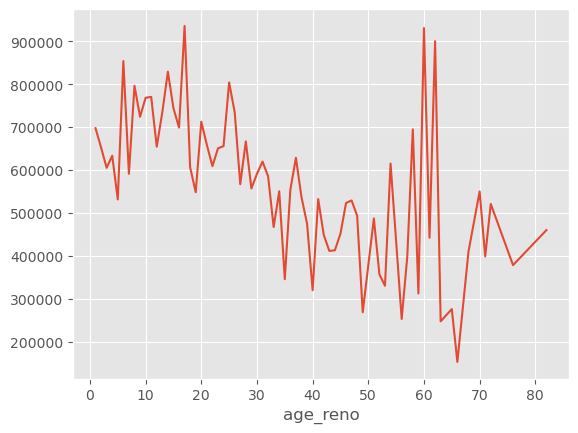

In [137]:
ren_data.groupby(['age_reno'])['price'].mean().plot()

In [138]:
#create renovated property mean price by zipcode
ren_mean = ren_data.groupby(['zipcode'])['price'].mean().reset_index()

In [139]:
ren_mean.head()

,zipcode,price
0,98001,245250.0000
1,98002,233230.0000
2,98003,369500.0000
3,98004,1176647.0588
4,98005,962900.0000


In [140]:
#rename for clarity
ren_mean = ren_mean.rename(columns={'price':'ren_mean_price'})

In [141]:
ren_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   zipcode         68 non-null     int64  
 1   ren_mean_price  68 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 1.2 KB


In [142]:
nonren = m2
nonren = nonren.loc[(nonren[['renovated']] == 0).all(axis=1)]

<Axes: xlabel='age'>

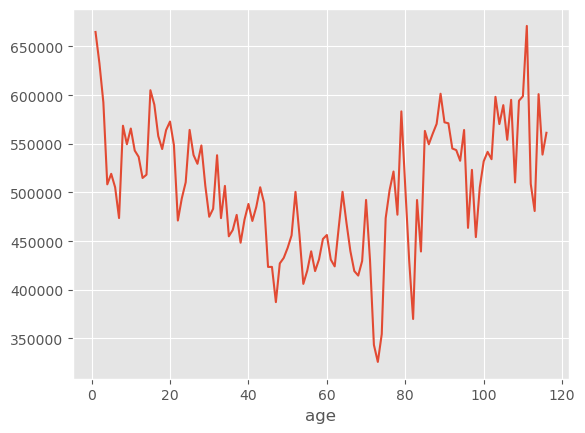

In [143]:
nonren.groupby(['age'])['price'].mean().plot()

In [144]:
nonren_mean = nonren.groupby(['zipcode'])['price'].mean().reset_index()

In [145]:
#rename for clarity
nonren_mean = nonren_mean.rename(columns={'price':'nonren_mean_price'})

In [146]:
nonren_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70 entries, 0 to 69
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   zipcode            70 non-null     int64  
 1   nonren_mean_price  70 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 1.2 KB


In [147]:
mean_compare = pd.merge(nonren_mean, ren_mean, on = ['zipcode'])

In [148]:
mean_compare['ren_price_increase'] = mean_compare['ren_mean_price'] - mean_compare['nonren_mean_price']

In [149]:
mean_compare.describe()

,zipcode,nonren_mean_price,ren_mean_price,ren_price_increase
count,68.0000,68.0000,68.0000,68.0000
mean,98078.6912,512193.0734,567086.9091,54893.8356
std,56.8597,207135.9972,249745.4017,126417.3707
min,98001.0000,232588.3403,144000.0000,-247071.7419
25%,98029.5000,349357.6875,375406.2500,-15026.5295
50%,98071.0000,474419.7033,521555.5556,48280.9307
75%,98118.2500,620423.0389,709207.5000,147287.5158
max,98199.0000,1200333.3333,1303333.3333,421035.2887


In [150]:
mean_compare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   zipcode             68 non-null     int64  
 1   nonren_mean_price   68 non-null     float64
 2   ren_mean_price      68 non-null     float64
 3   ren_price_increase  68 non-null     float64
dtypes: float64(3), int64(1)
memory usage: 2.3 KB


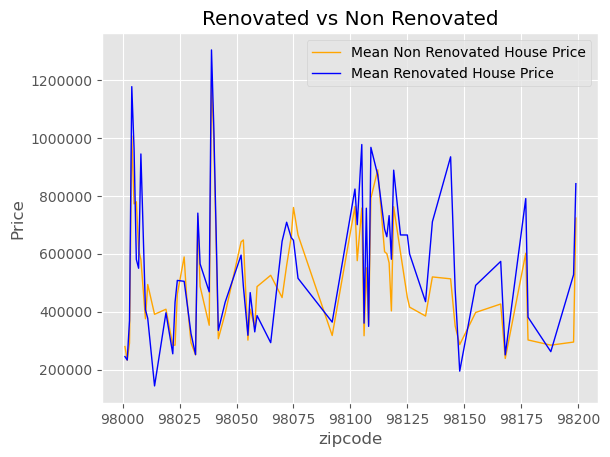

In [151]:
x = mean_compare['zipcode']
y = mean_compare['nonren_mean_price']
 
plt.plot(x, y,color='orange',linewidth=1, label = 'Mean Non Renovated House Price')
 
x1 = mean_compare['zipcode']
y1 = mean_compare['ren_mean_price']
 
plt.plot(x1, y1,color='blue',linewidth=1, label = 'Mean Renovated House Price')
 
plt.xlabel("zipcode")
plt.ylabel("Price")
plt.title('Renovated vs Non Renovated')
plt.ticklabel_format(useOffset=False, style='plain')
plt.legend()
plt.show()

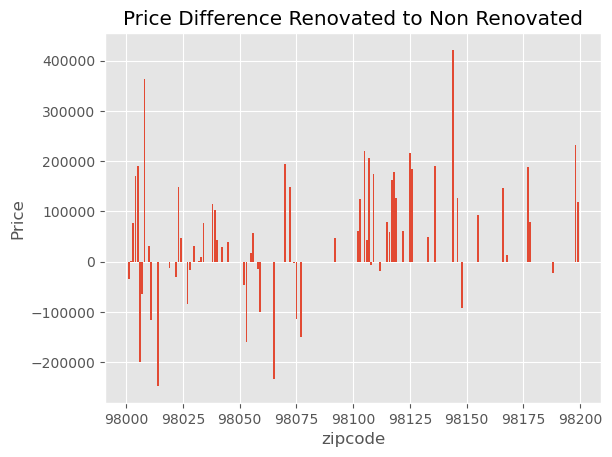

In [152]:
x = mean_compare['zipcode']
y = mean_compare['ren_mean_price']-mean_compare['nonren_mean_price']
 
plt.bar(x, y)
 
plt.xlabel("zipcode")
plt.ylabel("Price")
plt.title('Price Difference Renovated to Non Renovated')
plt.show()

In [153]:
# shows average across all zipcodes is an increase in $55,500 when renovated but not a definite improvement across zipcodes

In [154]:
#is there a change if renovation was recent?
ren10_data = m2
ren10_data = ren10_data.loc[((ren10_data[['yr_renovated']] >= 2006) & ren10_data[['yr_renovated']] <= 2010).all(axis=1)]
reng10_data = m2
reng10_data = reng10_data.loc[(reng10_data[['yr_renovated']] <= 2006).all(axis=1)]

In [155]:
ren10_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20708 entries, 0 to 20707
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          20708 non-null  float64
 1   bedrooms       20708 non-null  int64  
 2   bathrooms      20708 non-null  float64
 3   sqft_living    20708 non-null  int64  
 4   floors         20708 non-null  float64
 5   waterfront     20708 non-null  float64
 6   condition      20708 non-null  int64  
 7   grade          20708 non-null  int64  
 8   yr_renovated   20708 non-null  float64
 9   zipcode        20708 non-null  int64  
 10  lat            20708 non-null  float64
 11  long           20708 non-null  float64
 12  sqft_living15  20708 non-null  int64  
 13  sqft_lot15     20708 non-null  int64  
 14  age            20708 non-null  int64  
 15  month_sold     20708 non-null  int64  
 16  year_sold      20708 non-null  int64  
 17  renovated      20708 non-null  int64  
 18  has_basemen

In [156]:
ren10_mean = ren10_data.groupby(['zipcode'])['price'].mean().reset_index()

In [157]:
ren10_mean = ren10_mean.rename(columns={'price':'ren10_mean_price'})

In [158]:
reng10_mean = reng10_data.groupby(['zipcode'])['price'].mean().reset_index()

In [159]:
reng10_mean = reng10_mean.rename(columns={'price':'reng10_mean_price'})

In [160]:
mean_compare = pd.merge(mean_compare, reng10_mean, on = ['zipcode'])

In [161]:
mean_compare['reng10_price_increase'] = mean_compare['reng10_mean_price'] - mean_compare['nonren_mean_price']

In [162]:
mean_compare.head()

,zipcode,nonren_mean_price,ren_mean_price,ren_price_increase,reng10_mean_price,reng10_price_increase
0,98001,279876.6893,245250.0000,-34626.6893,280082.4382,205.7489
1,98002,232588.3403,233230.0000,641.6597,232604.7092,16.3689
2,98003,291957.2491,369500.0000,77542.7509,292202.0072,244.7581
3,98004,1006439.1745,1176647.0588,170207.8843,1019440.9912,13001.8167
4,98005,772133.3481,962900.0000,190766.6519,773412.6188,1279.2706


In [163]:
mean_compare = pd.merge(mean_compare, ren10_mean, on = ['zipcode'])

In [164]:
mean_compare['ren10_price_increase'] = mean_compare['ren10_mean_price'] - mean_compare['nonren_mean_price']

In [165]:
mean_compare.head()

,zipcode,nonren_mean_price,ren_mean_price,ren_price_increase,reng10_mean_price,reng10_price_increase,ren10_mean_price,ren10_price_increase
0,98001,279876.6893,245250.0000,-34626.6893,280082.4382,205.7489,279489.7989,-386.8904
1,98002,232588.3403,233230.0000,641.6597,232604.7092,16.3689,232604.7092,16.3689
2,98003,291957.2491,369500.0000,77542.7509,292202.0072,244.7581,292513.1111,555.8620
3,98004,1006439.1745,1176647.0588,170207.8843,1019440.9912,13001.8167,1019074.6943,12635.5198
4,98005,772133.3481,962900.0000,190766.6519,773412.6188,1279.2706,776843.6358,4710.2877


In [166]:
ren5_data = m2
ren5_data = ren5_data.loc[(ren5_data[['yr_renovated']] >= 2011).all(axis=1)]

In [167]:
ren5_mean = ren5_data.groupby(['zipcode'])['price'].mean().reset_index()

In [168]:
ren5_mean = ren5_mean.rename(columns={'price':'ren5_mean_price'})

In [169]:
mean_compare = pd.merge(mean_compare, ren5_mean, on = ['zipcode'])

In [170]:
mean_compare.head()

,zipcode,nonren_mean_price,ren_mean_price,ren_price_increase,reng10_mean_price,reng10_price_increase,ren10_mean_price,ren10_price_increase,ren5_mean_price
0,98003,291957.2491,369500.0000,77542.7509,292202.0072,244.7581,292513.1111,555.8620,379000.0000
1,98004,1006439.1745,1176647.0588,170207.8843,1019440.9912,13001.8167,1019074.6943,12635.5198,865000.0000
2,98005,772133.3481,962900.0000,190766.6519,773412.6188,1279.2706,776843.6358,4710.2877,772650.0000
3,98006,779282.1570,580519.2308,-198762.9262,776901.5344,-2380.6226,773652.7059,-5629.4511,594000.0000
4,98008,580396.9814,944333.3333,363936.3519,584043.4982,3646.5167,588337.4109,7940.4295,680000.0000


In [171]:
mean_compare['ren5_price_increase'] = mean_compare['ren5_mean_price'] - mean_compare['nonren_mean_price']

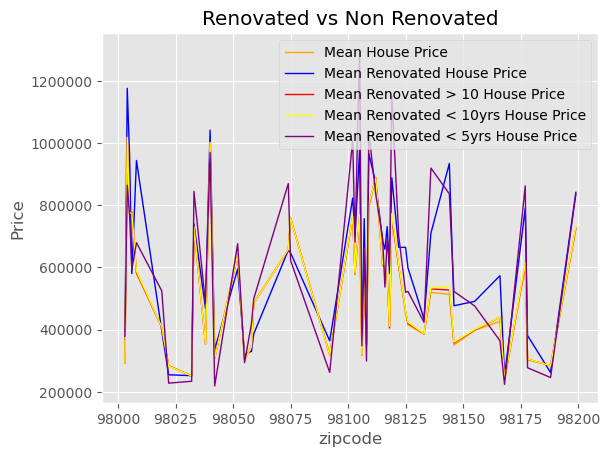

In [172]:
x = mean_compare['zipcode']
y = mean_compare['nonren_mean_price']
 
plt.plot(x, y,color='orange',linewidth=1, label = 'Mean House Price')
 
x1 = mean_compare['zipcode']
y1 = mean_compare['ren_mean_price']
 
plt.plot(x1, y1,color='blue',linewidth=1, label = 'Mean Renovated House Price')

x1 = mean_compare['zipcode']
y1 = mean_compare['reng10_mean_price']
 
plt.plot(x1, y1,color='red',linewidth=1, label = 'Mean Renovated > 10 House Price')


x1 = mean_compare['zipcode']
y1 = mean_compare['ren10_mean_price']
 
plt.plot(x1, y1,color='yellow',linewidth=1, label = 'Mean Renovated < 10yrs House Price')

x1 = mean_compare['zipcode']
y1 = mean_compare['ren5_mean_price']
 
plt.plot(x1, y1,color='purple',linewidth=1, label = 'Mean Renovated < 5yrs House Price')
 
plt.xlabel("zipcode")
plt.ylabel("Price")
plt.title('Renovated vs Non Renovated')
plt.ticklabel_format(useOffset=False, style='plain')
plt.legend()
plt.show()

In [173]:
mean_compare.describe()

,zipcode,nonren_mean_price,ren_mean_price,ren_price_increase,reng10_mean_price,reng10_price_increase,ren10_mean_price,ren10_price_increase,ren5_mean_price,ren5_price_increase
count,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000
mean,98093.8478,531155.0675,614146.6644,82991.5968,533983.5737,2828.5062,535656.9366,4501.8690,609430.5673,78275.4997
std,55.0890,206905.8121,245053.9555,115448.5376,207690.3095,4201.6732,208221.5899,5879.8225,270601.4312,149084.2389
min,98003.0000,238708.5191,251116.6667,-198762.9262,239042.4419,-2380.6226,238986.3134,-5629.4511,218996.6667,-185282.1570
25%,98044.5000,351386.4411,382498.1667,3034.2200,354768.4123,172.9999,354867.7224,78.0310,389250.0000,-28109.9967
50%,98106.5000,516789.6661,622921.8750,69234.1347,529284.1943,1063.9724,536871.9777,2854.4891,598675.0000,76792.8672
75%,98125.7500,706810.1657,782154.3269,168430.5967,710115.1473,4511.3128,712487.0214,8280.8114,836091.9643,122578.2125
max,98199.0000,1006439.1745,1176647.0588,421035.2887,1019440.9912,14104.2293,1019074.6943,25517.2902,1300000.0000,542329.0457


In [174]:
# Renovations data shows distinct effect by age with the renovations in the last 5 years showing the highest median price, create column renoved5
m2['ren5'] = m2.apply(lambda row: 0 if row['yr_renovated'] <= 2011 else 1, axis = 1)

<Axes: xlabel='ren5', ylabel='price'>

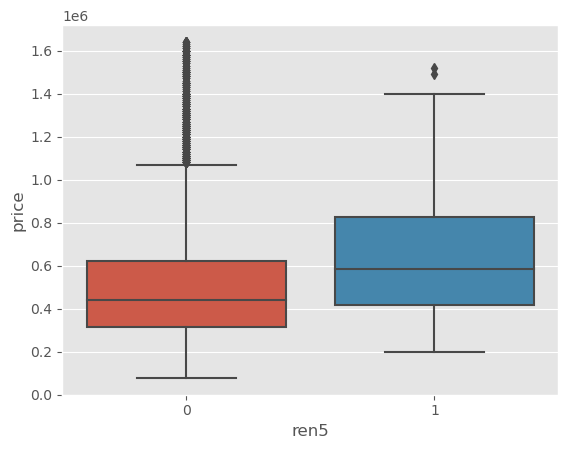

In [175]:
sns.boxplot(x='ren5', y='price', data=m2)

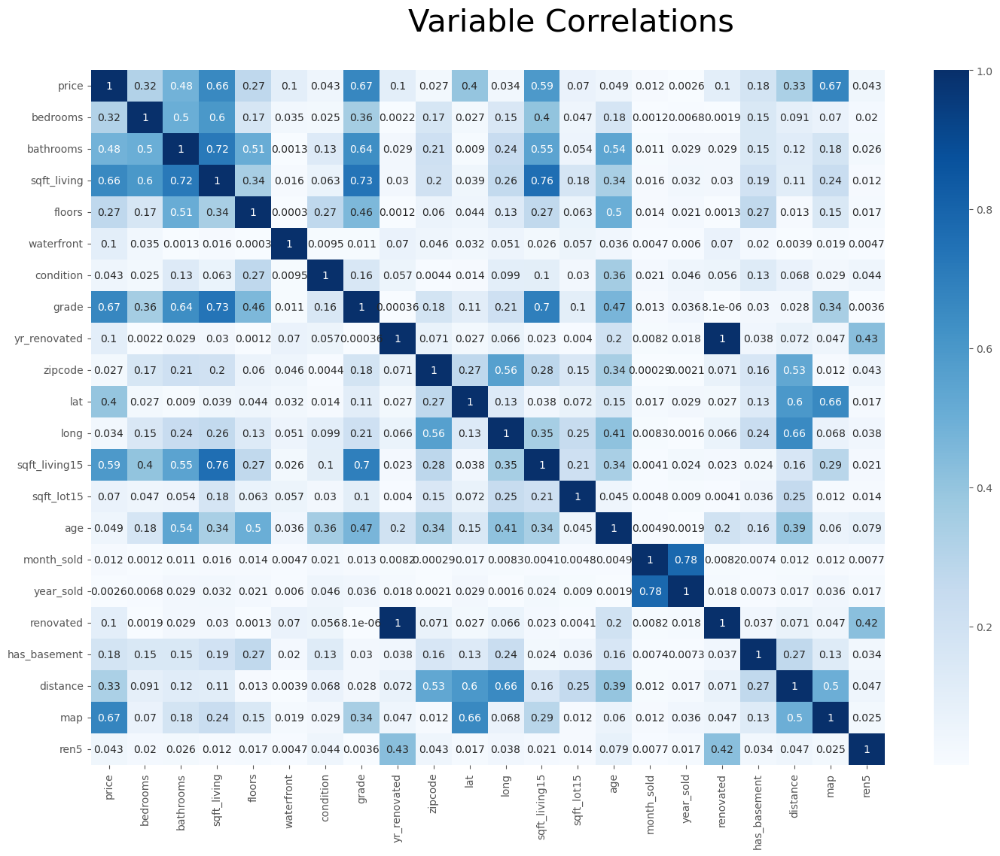

In [176]:
corr = m2.select_dtypes('number').corr().abs()
fig, ax=plt.subplots(figsize=(17,12))
fig.suptitle('Variable Correlations', fontsize=30, y=.95)
heatmap = sns.heatmap(corr, cmap='Blues', annot=True)

In [177]:
features = []
correlations = []
for idx, correlation in corr['price'].T.items():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_with_price = pd.DataFrame({'Correlations':correlations, 'Features': features})

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.items():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features})
print('Multicollinear Features')
display(MC_df)
print('Correlations with Price')
display(corr_with_price)

Multicollinear Features


,Correlations,Features
0,1.0000,"[yr_renovated, renovated]"
1,1.0000,"[renovated, yr_renovated]"


Correlations with Price


,Correlations,Features
0,0.3151,bedrooms
1,0.4817,bathrooms
2,0.6572,sqft_living
3,0.6653,grade
4,0.3959,lat
5,0.5899,sqft_living15
6,0.3346,distance
7,0.6722,map


In [178]:
# Does renovations influence grade or condition?

In [179]:
nonren_mean.head()

,zipcode,nonren_mean_price
0,98001,279876.6893
1,98002,232588.3403
2,98003,291957.2491
3,98004,1006439.1745
4,98005,772133.3481


In [180]:
ren_data = pd.merge(ren_data, nonren_mean, on = ['zipcode'])

<Axes: xlabel='yr_renovated'>

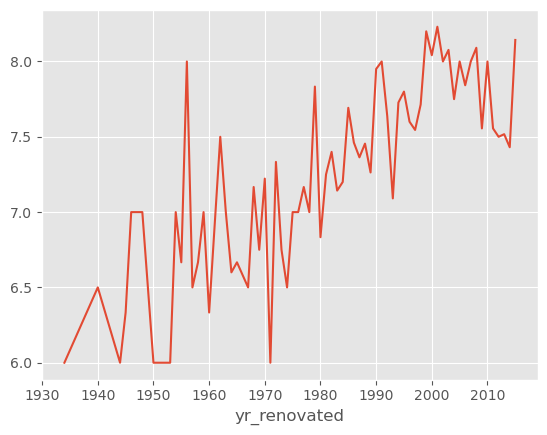

In [181]:
ren_data.groupby(['yr_renovated'])['grade'].mean().plot()

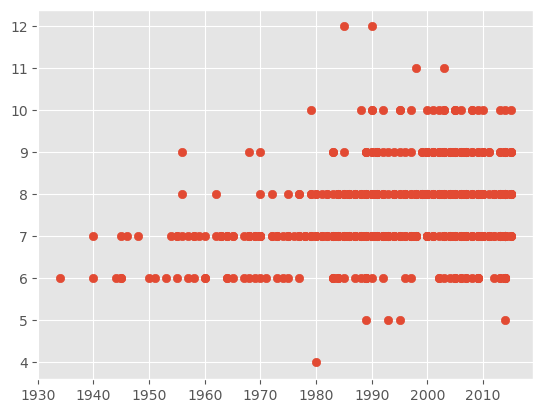

In [182]:
plt.scatter(ren_data.yr_renovated, ren_data.grade)

<Axes: xlabel='yr_renovated'>

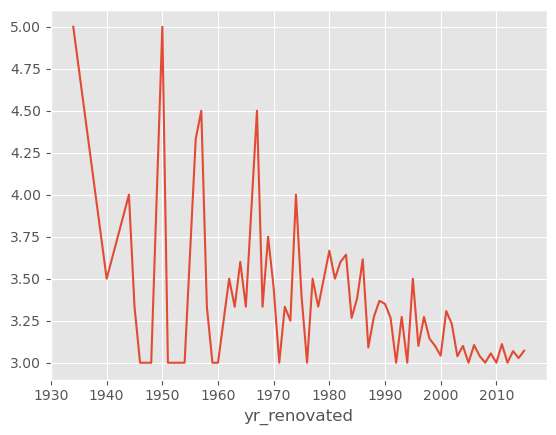

In [183]:
ren_data.groupby(['yr_renovated'])['condition'].mean().plot()

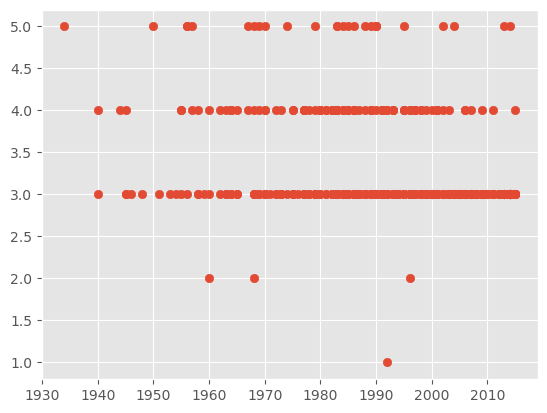

In [184]:
plt.scatter(ren_data.yr_renovated, ren_data.condition)

In [185]:
## Grade appears to be improved by the year renovated

<Axes: xlabel='age'>

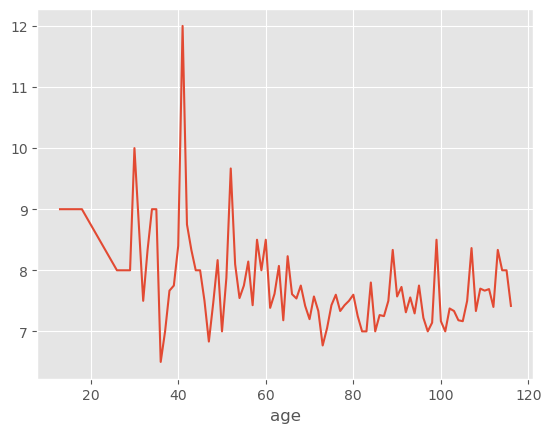

In [186]:
ren_data.groupby(['age'])['grade'].mean().plot()

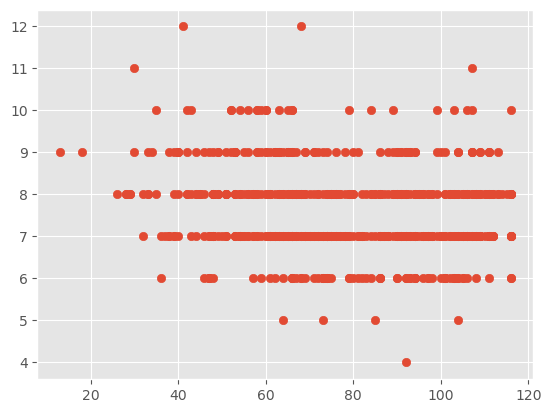

In [187]:
plt.scatter(ren_data.age, ren_data.grade)

<Axes: xlabel='age'>

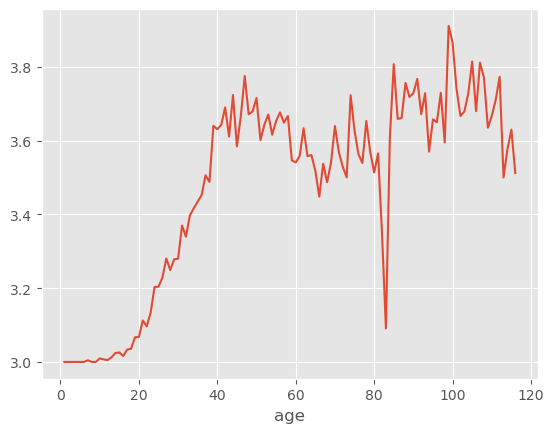

In [188]:
m2.groupby(['age'])['condition'].mean().plot()

In [189]:
ren_data.head()

,price,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,yr_renovated,zipcode,...,sqft_lot15,age,month_sold,year_sold,renovated,has_basement,distance,map,age_reno,nonren_mean_price
0,290900.0000,2,2.0000,1610,2.0000,0.0000,3,6,1983.0000,98178,...,12950,86,6,2014,1,0,14.3249,13,33.0000,302582.1905
1,190000.0000,2,1.0000,630,1.0000,0.0000,3,6,2005.0000,98178,...,6840,73,9,2014,1,0,14.7185,13,11.0000,302582.1905
2,210000.0000,3,1.0000,1200,1.0000,0.0000,3,6,1989.0000,98178,...,7000,111,11,2014,1,0,13.4066,13,27.0000,302582.1905
3,1100000.0000,4,3.2500,3190,2.0000,1.0000,3,8,1991.0000,98178,...,8725,60,7,2014,1,1,13.9983,13,25.0000,302582.1905
4,230000.0000,3,1.7500,1420,1.0000,0.0000,3,5,2014.0000,98178,...,5000,85,10,2014,1,1,13.3571,13,2.0000,302582.1905


In [190]:
ren_data['value_add'] = ren_data['price'] - ren_data['nonren_mean_price']

In [191]:
ren_data.describe()

,price,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,yr_renovated,zipcode,...,age,month_sold,year_sold,renovated,has_basement,distance,map,age_reno,nonren_mean_price,value_add
count,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,...,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000,668.0000
mean,644251.9581,3.3458,2.1793,2140.9551,1.4790,0.0269,3.2111,7.5868,1995.8353,98099.5539,...,77.2725,6.7156,2014.2769,1.0000,0.4805,14.2720,39.1751,20.1647,547949.1619,96302.7962
std,325836.0363,0.9525,0.7674,814.8096,0.4886,0.1620,0.5126,1.0418,16.0254,53.7376,...,21.8612,3.0192,0.4478,0.0000,0.5000,10.7568,18.2062,16.0254,193715.7529,265973.8274
min,110000.0000,1.0000,0.7500,520.0000,1.0000,0.0000,1.0000,4.0000,1934.0000,98001.0000,...,13.0000,1.0000,2014.0000,1.0000,0.0000,1.6079,0.0000,1.0000,232588.3403,-531782.1570
25%,400000.0000,3.0000,1.7500,1510.0000,1.0000,0.0000,3.0000,7.0000,1987.0000,98052.0000,...,62.0000,4.0000,2014.0000,1.0000,0.0000,7.3216,25.0000,8.0000,397506.6588,-88530.4822
50%,578750.0000,3.0000,2.0000,2075.0000,1.5000,0.0000,3.0000,7.0000,2000.0000,98115.0000,...,75.0000,7.0000,2014.0000,1.0000,0.0000,10.5475,41.0000,16.0000,551478.8360,42407.4663
75%,830250.0000,4.0000,2.7500,2690.0000,2.0000,0.0000,3.0000,8.0000,2008.0000,98133.0000,...,95.2500,9.0000,2015.0000,1.0000,1.0000,17.6009,52.0000,29.0000,613564.8309,223531.0794
max,1640000.0000,6.0000,4.2500,4960.0000,3.0000,1.0000,5.0000,12.0000,2015.0000,98199.0000,...,116.0000,12.0000,2015.0000,1.0000,1.0000,73.8318,69.0000,82.0000,1200333.3333,1213361.5551


<Axes: xlabel='yr_renovated'>

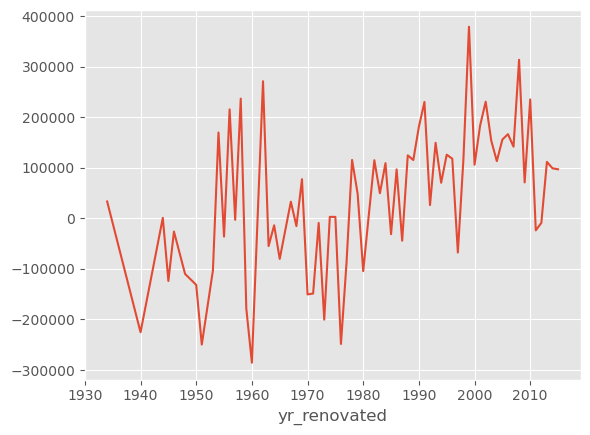

In [192]:
ren_data.groupby(['yr_renovated'])['value_add'].mean().plot()

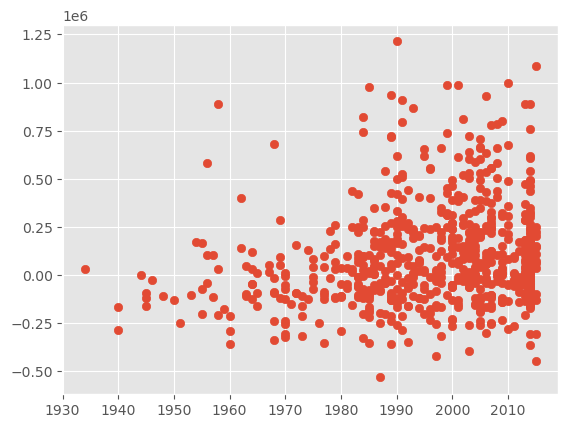

In [193]:
plt.scatter(ren_data.yr_renovated, ren_data.value_add)

<Axes: xlabel='yr_renovated'>

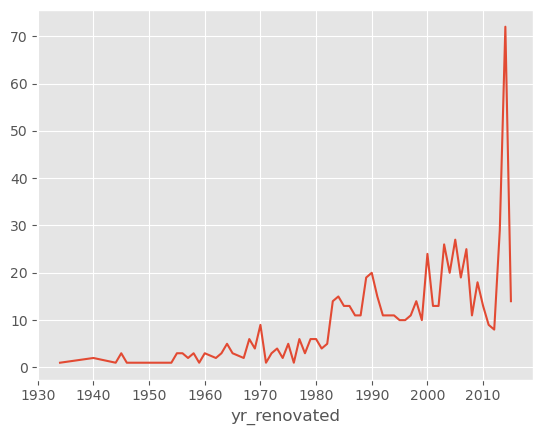

In [194]:
ren_data.groupby(['yr_renovated'])['value_add'].count().plot()

<Axes: xlabel='age'>

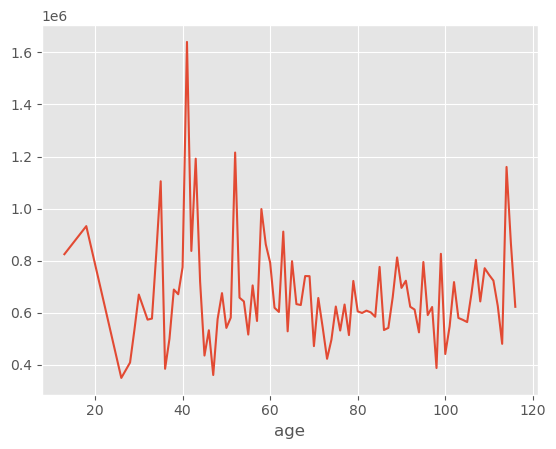

In [195]:
ren_data.groupby(['age'])['price'].mean().plot()

<Axes: xlabel='age'>

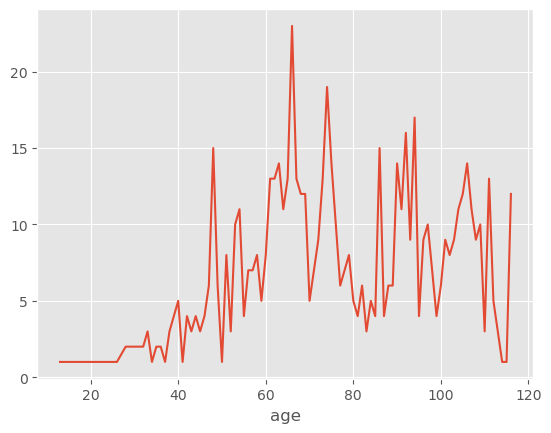

In [196]:
ren_data.groupby(['age'])['value_add'].count().plot()

In [197]:
ren_data['yr_renovated'].nunique()

69

In [198]:
ren_data['yr_renovated'].value_counts().sum()

668

In [199]:
m2['age'].value_counts()

age
2      534
11     432
10     422
12     405
13     404
      ... 
115     27
114     26
81      23
83      22
82      20
Name: count, Length: 116, dtype: int64

<Axes: xlabel='age'>

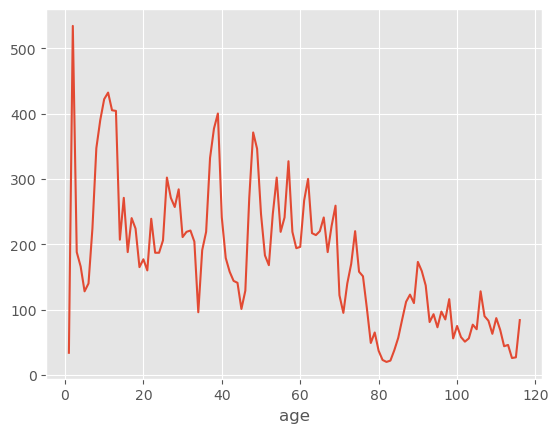

In [200]:
m2.groupby(['age'])['price'].count().plot()

<Axes: xlabel='age'>

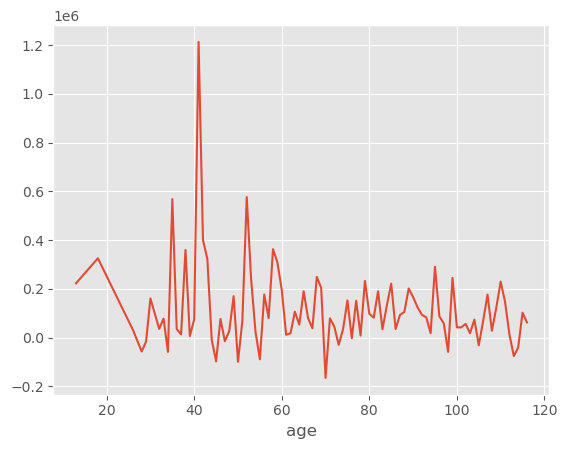

In [201]:
ren_data.groupby(['age'])['value_add'].mean().plot()

In [202]:
#investigate waterfront
m2.groupby(['waterfront'])['price'].mean()

waterfront
0.0000   501109.3592
1.0000   925057.2368
Name: price, dtype: float64

In [203]:
m2.groupby(['waterfront', 'zipcode'])['zipcode'].value_counts()

waterfront  zipcode
0.0000      98001      358
            98002      196
            98003      279
            98004      229
            98005      162
                      ... 
1.0000      98155        1
            98166       10
            98177        1
            98178        8
            98198        9
Name: count, Length: 89, dtype: int64

In [204]:
waterfront_data = m2
waterfront_data = waterfront_data.loc[(waterfront_data[['waterfront']] != 0).all(axis=1)]

In [205]:
waterfront_data.head()

,price,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,yr_renovated,zipcode,...,sqft_living15,sqft_lot15,age,month_sold,year_sold,renovated,has_basement,distance,map,ren5
18,825000.0000,2,1.0000,1150,1.0000,1.0000,4,6,0.0000,98178,...,2440,11852,108,8,2014,0,0,14.2467,13,0
21,790000.0000,4,1.7500,2460,1.0000,1.0000,3,7,0.0000,98178,...,2300,10061,55,12,2014,0,1,12.7853,13,0
45,700000.0000,2,1.0000,1160,1.0000,1.0000,3,6,0.0000,98178,...,1510,13122,71,10,2014,0,0,12.2710,13,0
67,1100000.0000,4,3.2500,3190,2.0000,1.0000,3,8,1991.0000,98178,...,2240,8725,60,7,2014,1,1,13.9983,13,0
143,750000.0000,5,1.7500,2640,1.0000,1.0000,4,8,0.0000,98178,...,2400,11942,62,1,2015,0,1,14.1850,13,0


In [206]:
waterfront_data['zipcode'].value_counts()

zipcode
98070    18
98166    10
98198     9
98178     8
98146     6
98125     4
98136     3
98023     3
98075     3
98008     2
98118     2
98074     1
98052     1
98056     1
98028     1
98034     1
98040     1
98177     1
98155     1
Name: count, dtype: int64

In [207]:
waterfront_data['zipcode'].value_counts().sum()

76

In [208]:
waterfront_data.describe()

,price,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,yr_renovated,zipcode,...,sqft_living15,sqft_lot15,age,month_sold,year_sold,renovated,has_basement,distance,map,ren5
count,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,...,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000,76.0000
mean,925057.2368,2.8421,2.0822,2214.8684,1.4803,1.0000,3.5132,7.7763,471.0789,98119.3684,...,2226.3158,25207.9211,62.4868,6.8158,2014.2763,0.2368,0.5395,19.0678,28.3947,0.0000
std,392283.8430,0.9805,0.7804,868.1865,0.5443,0.0000,0.7393,1.4198,851.2453,57.6992,...,634.7716,26482.6612,23.3132,3.2113,0.4501,0.4280,0.5018,6.6799,13.5106,0.0000
min,285000.0000,1.0000,0.7500,440.0000,1.0000,1.0000,1.0000,5.0000,0.0000,98008.0000,...,750.0000,3230.0000,9.0000,1.0000,2014.0000,0.0000,0.0000,7.1907,7.0000,0.0000
25%,611250.0000,2.0000,1.7500,1730.0000,1.0000,1.0000,3.0000,7.0000,0.0000,98070.0000,...,1787.5000,11919.5000,43.5000,4.0000,2014.0000,0.0000,0.0000,13.2272,13.0000,0.0000
50%,854750.0000,3.0000,2.2500,2145.0000,1.5000,1.0000,3.0000,8.0000,0.0000,98130.5000,...,2285.0000,16852.0000,62.0000,7.0000,2014.0000,0.0000,1.0000,17.7150,30.0000,0.0000
75%,1235000.0000,3.0000,2.5000,2762.2500,2.0000,1.0000,4.0000,9.0000,0.0000,98166.0000,...,2725.0000,27653.0000,79.2500,10.0000,2015.0000,0.0000,1.0000,24.4783,33.0000,0.0000
max,1640000.0000,6.0000,3.7500,5470.0000,3.0000,1.0000,5.0000,12.0000,2006.0000,98198.0000,...,3620.0000,192268.0000,111.0000,12.0000,2015.0000,1.0000,1.0000,33.2045,67.0000,0.0000


In [209]:
# investigate grade 

In [210]:
m2['grade'].value_counts()

grade
7     8844
8     5936
9     2454
6     2016
10     928
11     239
5      235
12      28
4       27
3        1
Name: count, dtype: int64

In [211]:
ren_data['grade'].value_counts()

grade
7     271
8     205
9      89
6      70
10     24
5       4
11      2
12      2
4       1
Name: count, dtype: int64

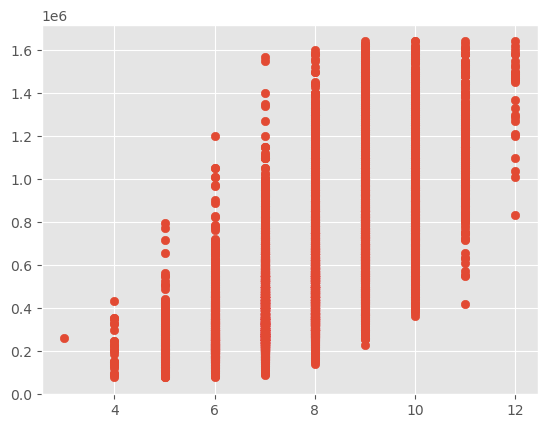

In [212]:
plt.scatter(m2.grade,m2.price)

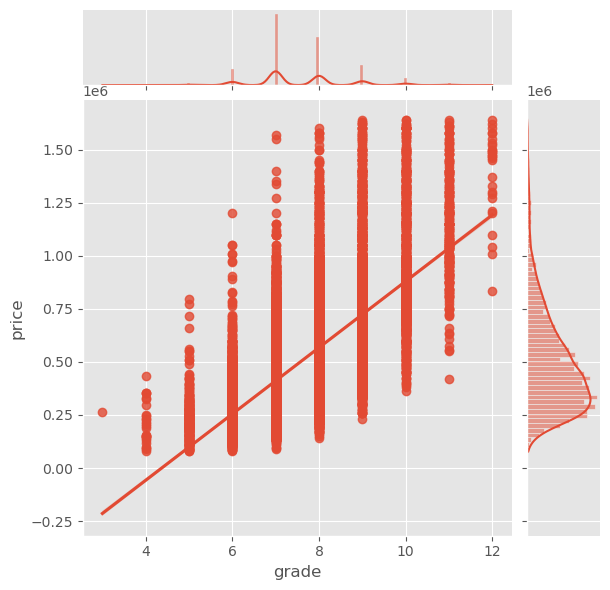

In [213]:
sns.jointplot(data = m2, x= 'grade', y ='price', kind='reg')

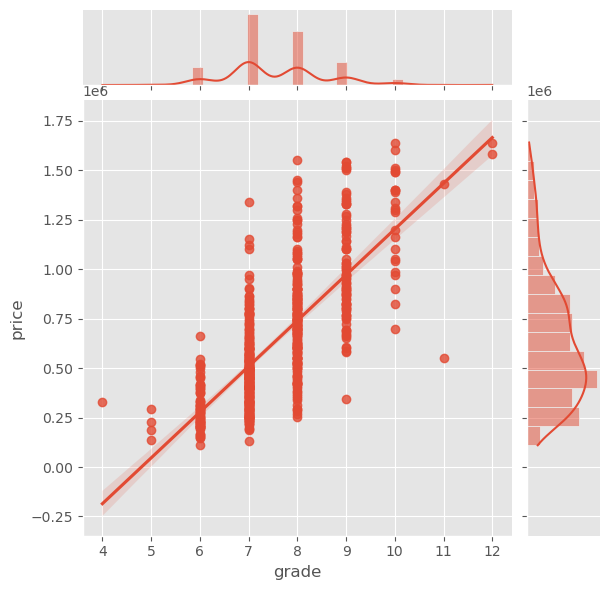

In [214]:
sns.jointplot(data = ren_data, x= 'grade', y ='price', kind='reg')

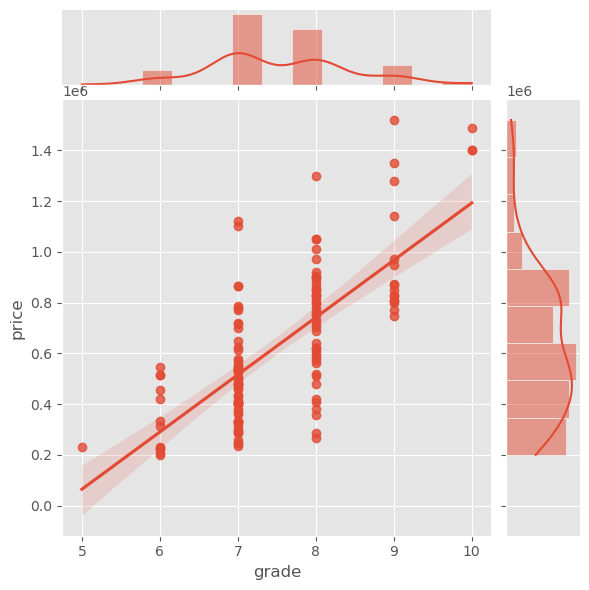

In [215]:
sns.jointplot(data = ren5_data, x= 'grade', y ='price', kind='reg')

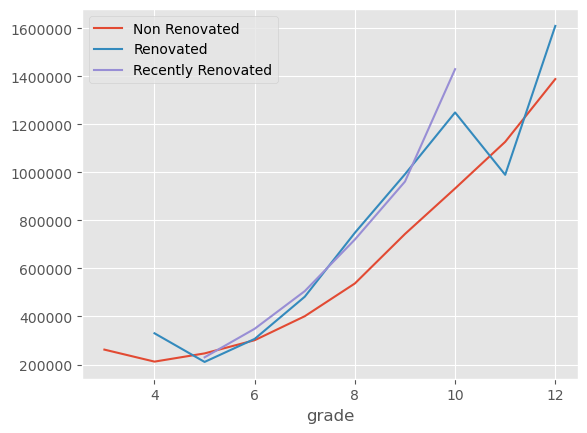

In [216]:
nr_grade = m2.groupby(['grade'])['price'].mean().plot(label = 'Non Renovated')
r_grade = ren_data.groupby(['grade'])['price'].mean().plot(label = 'Renovated')
r5_grade = ren5_data.groupby(['grade'])['price'].mean().plot(label = 'Recently Renovated')
plt.ticklabel_format(useOffset=False, style='plain')
plt.legend()

In [217]:
#grade is significantly effects the price but with limited data, there is only one example of an 11 rating and no example of a 12
#Price is significantly higher for renovated properties, with further gains when recently renovated 

In [218]:
m2['condition'].value_counts()

condition
3    13407
4     5490
5     1623
2      160
1       28
Name: count, dtype: int64

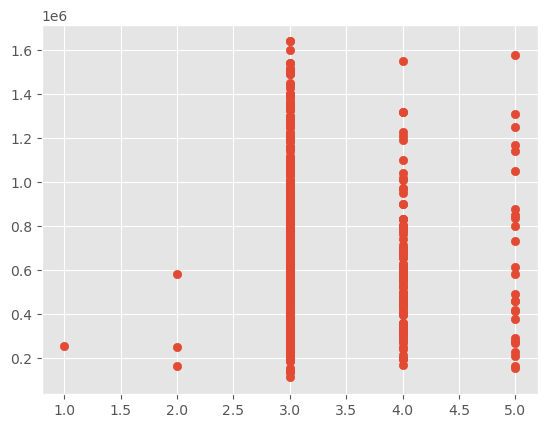

In [219]:
plt.scatter(ren_data.condition,ren_data.price)

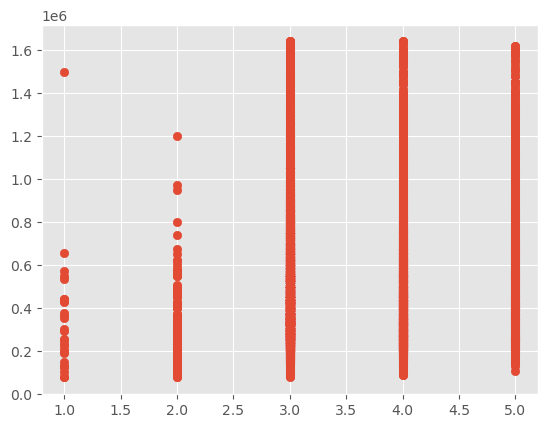

In [220]:
plt.scatter(m2.condition,m2.price)

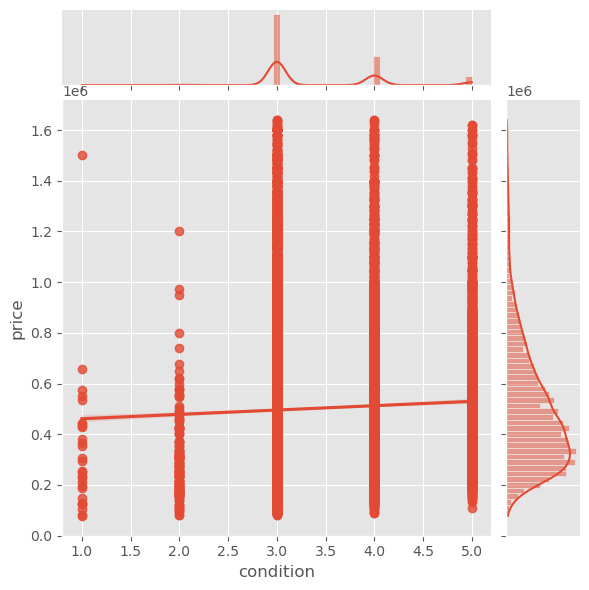

In [221]:
sns.jointplot(data = m2, x= 'condition', y ='price', kind='reg')

<Axes: xlabel='condition'>

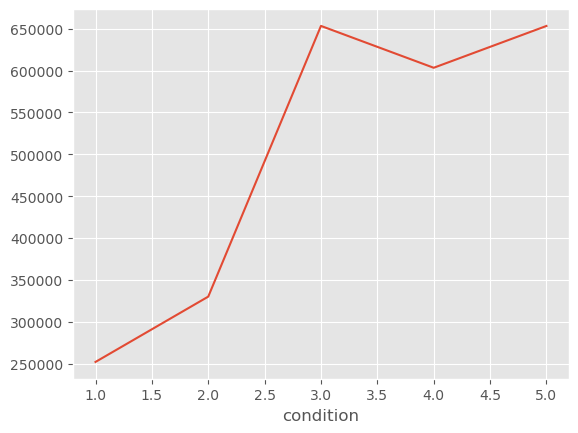

In [222]:
ren_data.groupby(['condition'])['price'].mean().plot()

In [223]:
ren_data.groupby(['condition'])['price'].mean()

condition
1   252000.0000
2   330000.0000
3   653341.4614
4   603349.6064
5   653295.7692
Name: price, dtype: float64

In [224]:
ren_data['condition'].value_counts()

condition
3    544
4     94
5     26
2      3
1      1
Name: count, dtype: int64

In [225]:
m2['condition'].value_counts()

condition
3    13407
4     5490
5     1623
2      160
1       28
Name: count, dtype: int64

In [226]:
ren_data.groupby(['condition'])['grade'].mean()

condition
1   6.0000
2   7.3333
3   7.6103
4   7.4362
5   7.7308
Name: grade, dtype: float64

In [227]:
m2.groupby(['condition'])['grade'].mean()

condition
1   5.9643
2   6.5000
3   7.7538
4   7.3230
5   7.2360
Name: grade, dtype: float64

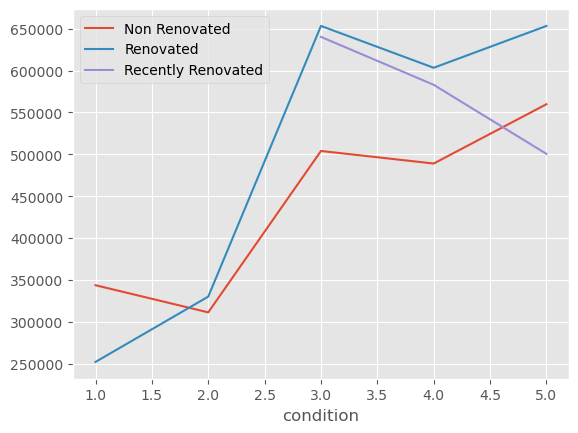

In [228]:
nr_condition = m2.groupby(['condition'])['price'].mean().plot(label = 'Non Renovated')
r_condition = ren_data.groupby(['condition'])['price'].mean().plot(label = 'Renovated')
r5_condition = ren5_data.groupby(['condition'])['price'].mean().plot(label = 'Recently Renovated')
plt.ticklabel_format(useOffset=False, style='plain')
plt.legend()

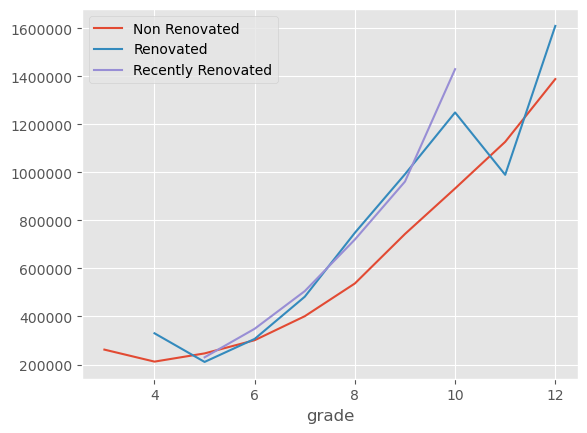

In [229]:
nr_condition = m2.groupby(['grade'])['price'].mean().plot(label = 'Non Renovated')
r_condition = ren_data.groupby(['grade'])['price'].mean().plot(label = 'Renovated')
r5_condition = ren5_data.groupby(['grade'])['price'].mean().plot(label = 'Recently Renovated')
plt.ticklabel_format(useOffset=False, style='plain')
plt.legend()

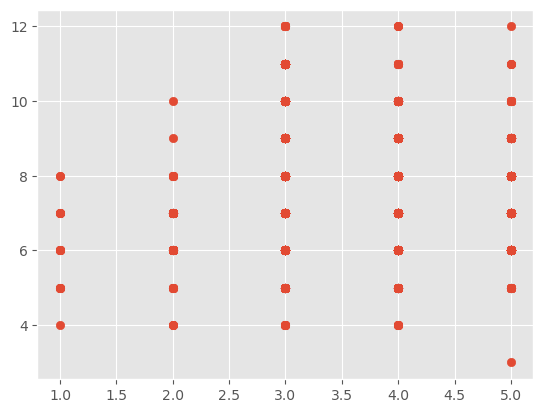

In [230]:
plt.scatter(m2.condition,m2.grade)

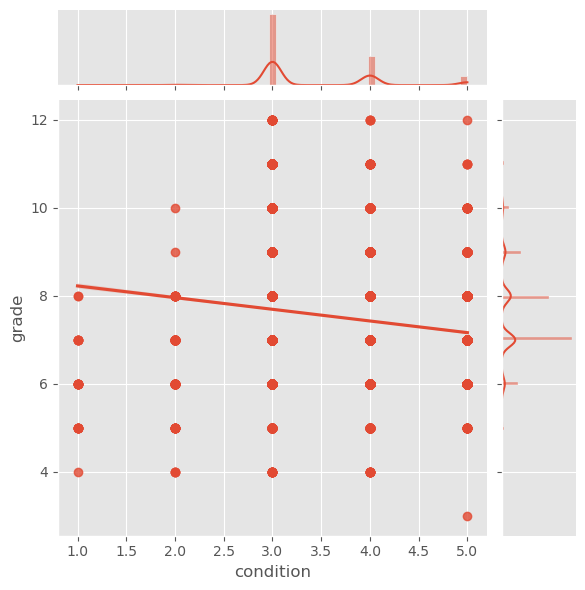

In [231]:
sns.jointplot(data = m2, x= 'condition', y ='grade', kind='reg')

In [232]:
# It appears that there is an effect on price by condition but hard to determine reasons. 
# The condition could not have a clear criterea. 
# It seems that although recently renovated does not seem to have an increase in price with increase in condition, 
# there are no examples of recently renovated properties with a condition less than 3.

In [233]:
# Given the provided descriptions, I will drop condition as it appears to be subjective with out a system
# * **grade** - overall grade given to the housing unit, based on King County grading system
# * **condition** - How good the condition is ( Overall )

In [234]:
# in model interation 2 we will drop the features that are not categorial that do not have linearity and other reasons

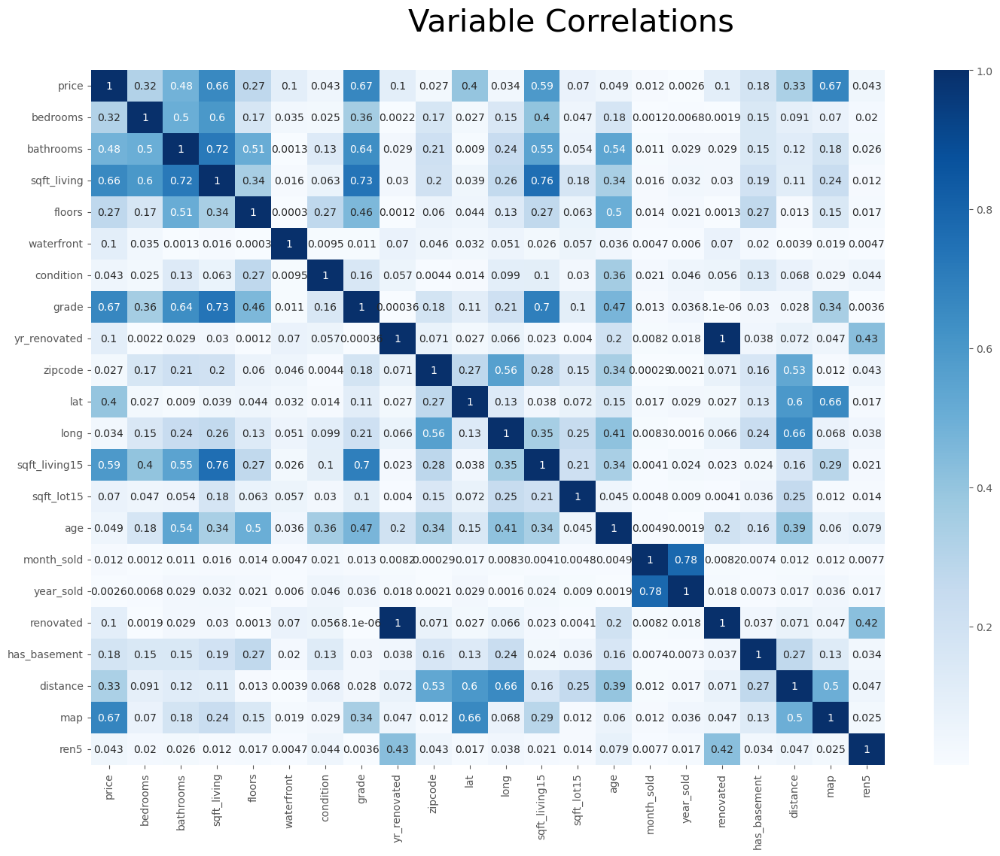

In [235]:
corr = m2.select_dtypes('number').corr().abs()
fig, ax=plt.subplots(figsize=(17,12))
fig.suptitle('Variable Correlations', fontsize=30, y=.95)
heatmap = sns.heatmap(corr, cmap='Blues', annot=True)

In [236]:
features = []
correlations = []
for idx, correlation in corr['price'].T.items():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_with_price = pd.DataFrame({'Correlations':correlations, 'Features': features})

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.items():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features})
print('Multicollinear Features')
display(MC_df)
print('Correlations with Price')
display(corr_with_price)

Multicollinear Features


,Correlations,Features
0,1.0000,"[yr_renovated, renovated]"
1,1.0000,"[renovated, yr_renovated]"


Correlations with Price


,Correlations,Features
0,0.3151,bedrooms
1,0.4817,bathrooms
2,0.6572,sqft_living
3,0.6653,grade
4,0.3959,lat
5,0.5899,sqft_living15
6,0.3346,distance
7,0.6722,map


In [237]:
outcome = 'price'
x_cols = m2.drop("price", axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model2 = ols(formula=formula, data=m2).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     3817.
Date:                Thu, 15 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:35:14   Log-Likelihood:            -2.7090e+05
No. Observations:               20708   AIC:                         5.418e+05
Df Residuals:                   20686   BIC:                         5.420e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -6.185e+07   6.02e+06    -10.281      0.000   -7.36e+07   -5.01e+07
bedrooms      -1.434e+04   1222.542    -11.727      0.000   -1.67e+04   -1.19e+04
bathrooms      2.289e+04   2033.277     11.257      0.000    1.89e+04    2.69e+04
sqft_living     116.9962      2.215     52.816      0.000     112.654     121.338
floors         3699.5781   2110.147      1.753      0.080    -436.475    7835.632
waterfront     3.727e+05   1.35e+04     27.585      0.000    3.46e+05    3.99e+05
condition      2.292e+04   1389.076     16.503      0.000    2.02e+04    2.56e+04
grade          6.097e+04   1326.778     45.954      0.000    5.84e+04    6.36e+04
yr_renovated   2518.3594    333.122      7.560      0.000    1865.415    3171.304
zipcode        -139.2300     19.936     -6.984      0.000    -178.306    -100.154
lat           -1.663e+04   8815.641     -1.887      0.059   -3.39e+04     647.238
long          -7.754e+04   1.02e+04     -7.579      0.000   -9.76e+04   -5.75e+04
sqft_living15    32.6903      2.158     15.147      0.000      28.460      36.921
sqft_lot15        0.0879      0.055      1.603      0.109      -0.020       0.195
age            1275.1966     44.357     28.748      0.000    1188.253    1362.140
month_sold     1274.8236    417.301      3.055      0.002     456.880    2092.767
year_sold      3.291e+04   2784.057     11.821      0.000    2.75e+04    3.84e+04
renovated     -4.975e+06   6.64e+05     -7.497      0.000   -6.28e+06   -3.67e+06
has_basement  -1.339e+04   2027.129     -6.606      0.000   -1.74e+04   -9418.089
distance      -3419.8363    167.718    -20.390      0.000   -3748.576   -3091.096
map            5437.7858     74.507     72.984      0.000    5291.747    5583.824
ren5          -3.825e+04   1.37e+04     -2.789      0.005   -6.51e+04   -1.14e+04
==============================================================================
Omnibus:                     5545.754   Durbin-Watson:                   1.665
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25815.363
Skew:                           1.231   Prob(JB):                         0.00
Kurtosis:                       7.884   Cond. No.                     7.35e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.35e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<Figure size 1200x800 with 0 Axes>

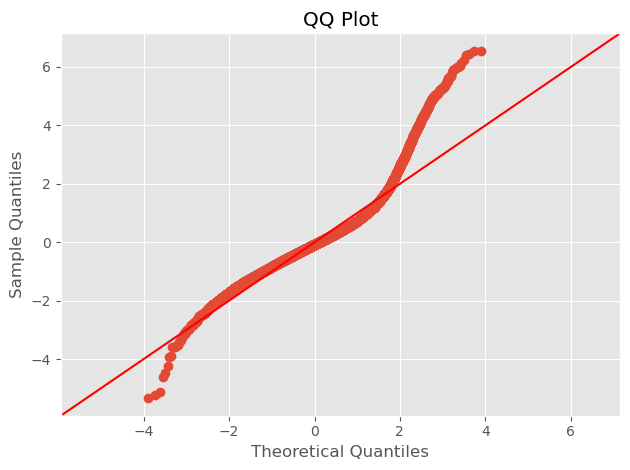

In [238]:
plt.figure(figsize=(12, 8))
fig = sm.graphics.qqplot(model2.resid, dist=stats.norm, line='45', fit=True)
plt.title('QQ Plot')
plt.tight_layout()
plt.show()

In [239]:
m3 = m2.drop(columns=['waterfront', 'yr_renovated', 'lat', 'long', 'age', 'map'])

In [240]:
outcome = 'price'
x_cols = m3.drop("price", axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model3 = ols(formula=formula, data=m3).fit()
model3.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                     3215.
Date:                Thu, 15 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:35:14   Log-Likelihood:            -2.7485e+05
No. Observations:               20708   AIC:                         5.497e+05
Df Residuals:                   20692   BIC:                         5.499e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      -9.88e+06   7.14e+06     -1.384      0.166   -2.39e+07    4.11e+06
bedrooms      -1.978e+04   1472.073    -13.439      0.000   -2.27e+04   -1.69e+04
bathrooms      2575.2417   2313.435      1.113      0.266   -1959.272    7109.756
sqft_living     119.5033      2.644     45.197      0.000     114.321     124.686
floors        -3886.5153   2473.316     -1.571      0.116   -8734.410     961.379
condition      4.301e+04   1592.357     27.008      0.000    3.99e+04    4.61e+04
grade          7.028e+04   1522.579     46.156      0.000    6.73e+04    7.33e+04
zipcode        -477.9672     22.390    -21.347      0.000    -521.854    -434.081
sqft_living15    69.9856      2.552     27.419      0.000      64.983      74.989
sqft_lot15        0.5902      0.066      8.964      0.000       0.461       0.719
month_sold      750.8320    504.665      1.488      0.137    -238.352    1740.016
year_sold      2.803e+04   3366.656      8.327      0.000    2.14e+04    3.46e+04
renovated      1.074e+05   6144.431     17.479      0.000    9.54e+04    1.19e+05
has_basement  -1.033e+04   2436.726     -4.241      0.000   -1.51e+04   -5558.019
distance      -1.131e+04    117.834    -95.950      0.000   -1.15e+04   -1.11e+04
ren5           7233.4192   1.41e+04      0.514      0.607   -2.03e+04    3.48e+04
==============================================================================
Omnibus:                     4260.485   Durbin-Watson:                   1.269
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            12776.363
Skew:                           1.069   Prob(JB):                         0.00
Kurtosis:                       6.200   Cond. No.                     7.21e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.21e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<Figure size 1200x800 with 0 Axes>

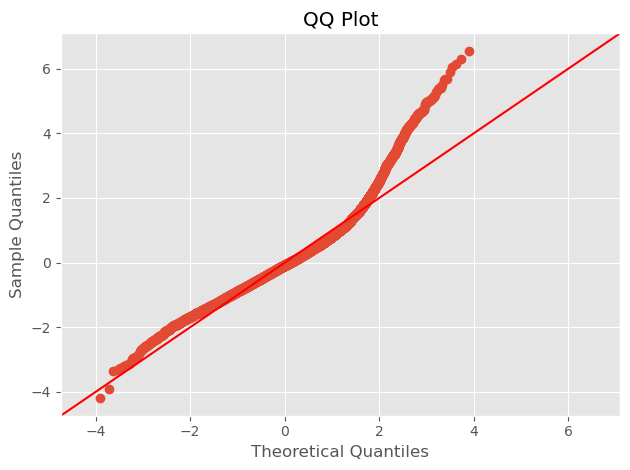

In [241]:
plt.figure(figsize=(12, 8))
fig = sm.graphics.qqplot(model3.resid, dist=stats.norm, line='45', fit=True)
plt.title('QQ Plot')
plt.tight_layout()
plt.show()

In [242]:
# The model still has a high condition number, implying multicolinarity but the JB has decreased significantly indicating the error distribution has improved.
# We need to convert the categoricals to dummies and normalise the remaining variables

In [243]:
m3.drop(columns=['month_sold', 'ren5'], inplace=True)

In [244]:
outcome = 'price'
x_cols = m3.drop("price", axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model3 = ols(formula=formula, data=m3).fit()
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                     3710.
Date:                Thu, 15 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:35:15   Log-Likelihood:            -2.7485e+05
No. Observations:               20708   AIC:                         5.497e+05
Df Residuals:                   20694   BIC:                         5.498e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1.942e+06   4.75e+06     -0.408      0.683   -1.13e+07    7.38e+06
bedrooms      -1.977e+04   1471.752    -13.434      0.000   -2.27e+04   -1.69e+04
bathrooms      2568.7797   2312.340      1.111      0.267   -1963.588    7101.147
sqft_living     119.5407      2.644     45.215      0.000     114.359     124.723
floors        -3907.4871   2471.888     -1.581      0.114   -8752.581     937.607
condition      4.291e+04   1590.902     26.974      0.000    3.98e+04     4.6e+04
grade          7.025e+04   1522.458     46.141      0.000    6.73e+04    7.32e+04
zipcode        -478.0748     22.390    -21.352      0.000    -521.961    -434.189
sqft_living15    69.9128      2.552     27.396      0.000      64.911      74.915
sqft_lot15        0.5899      0.066      8.959      0.000       0.461       0.719
year_sold       2.41e+04   2096.076     11.498      0.000       2e+04    2.82e+04
renovated      1.086e+05   5585.291     19.447      0.000    9.77e+04     1.2e+05
has_basement   -1.03e+04   2436.655     -4.229      0.000   -1.51e+04   -5527.757
distance      -1.131e+04    117.824    -95.960      0.000   -1.15e+04   -1.11e+04
==============================================================================
Omnibus:                     4262.881   Durbin-Watson:                   1.269
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            12791.336
Skew:                           1.069   Prob(JB):                         0.00
Kurtosis:                       6.202   Cond. No.                     4.80e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.8e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<Figure size 1200x800 with 0 Axes>

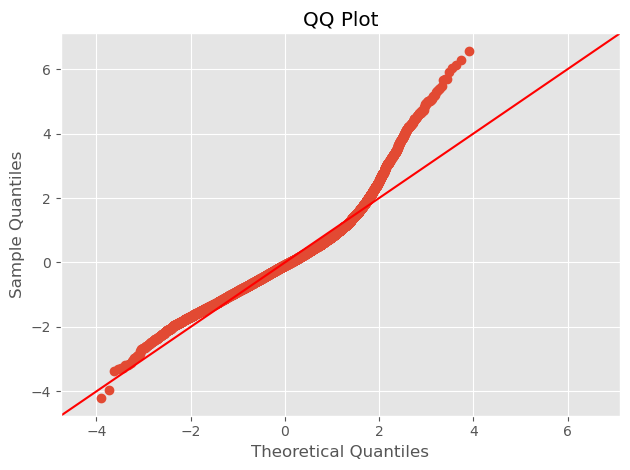

In [245]:
plt.figure(figsize=(12, 8))
fig = sm.graphics.qqplot(model3.resid, dist=stats.norm, line='45', fit=True)
plt.title('QQ Plot')
plt.tight_layout()
plt.show()

In [246]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

regression = LinearRegression()

In [247]:
# Due to the definition of bathrooms being "**bathroomsNumber** -  of bathrooms/bedrooms", the number of bathrooms seems 
# doesnt make sense. With no modifications the numbers do not make sense with many .25 values. 
# When applying a formula multiplying this figure by the number of bedrooms there are numbers that would not be normal. 
# We will drop bathrooms from the analysis due to not being able to substantiate the values.

In [248]:
m4 = m3.drop(columns=['bathrooms'])

continuous = [
 'price',
 'sqft_living',
 'sqft_living15'
 ]
categoricals = [
 'bedrooms',
 'grade', 
 'condition',
 'zipcode',
 'renovated',
 'has_basement'
]

cln_cont = m4[continuous]

# log features
log_names = [f"{column}_log" for column in cln_cont.columns]

cln_log = np.log(cln_cont)
cln_log.columns = log_names

# normalize (subract mean and divide by std)
def normalize(feature):
    return (feature - feature.mean()) / feature.std()


cln_log_norm = cln_log.apply(normalize)

# one hot encode categoricals
cln_ohe = pd.get_dummies(m4[categoricals], columns=categoricals, drop_first=True)

preprocessed4 = pd.concat([cln_log_norm, cln_ohe], axis=1)

X = preprocessed4.drop("price_log", axis=1)
y = preprocessed4["price_log"]

crossvalidation = KFold(n_splits=10, shuffle=True, random_state=1)
baseline = np.mean(cross_val_score(regression, X, y, scoring="r2", cv=crossvalidation))

baseline

-4.5769554244965344e+17

In [249]:
outcome = 'price_log'
x_cols = preprocessed4.drop("price_log", axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model4 = ols(formula=formula, data=preprocessed4).fit()
model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     1308.
Date:                Thu, 15 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:35:16   Log-Likelihood:                -9578.6
No. Observations:               20708   AIC:                         1.934e+04
Df Residuals:                   20616   BIC:                         2.007e+04
Df Model:                          91                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -0.6034      0.394     -1.531      0.126      -1.376       0.169
bedrooms_2[T.True]        -0.0732      0.030     -2.464      0.014      -0.131      -0.015
bedrooms_3[T.True]        -0.1174      0.030     -3.916      0.000      -0.176      -0.059
bedrooms_4[T.True]        -0.1277      0.031     -4.138      0.000      -0.188      -0.067
bedrooms_5[T.True]        -0.1620      0.033     -4.964      0.000      -0.226      -0.098
bedrooms_6[T.True]        -0.1749      0.041     -4.283      0.000      -0.255      -0.095
grade_4[T.True]           -1.0767      0.394     -2.735      0.006      -1.848      -0.305
grade_5[T.True]           -1.1094      0.388     -2.860      0.004      -1.870      -0.349
grade_6[T.True]           -0.9859      0.387     -2.545      0.011      -1.745      -0.227
grade_7[T.True]           -0.8560      0.387     -2.209      0.027      -1.615      -0.097
grade_8[T.True]           -0.6835      0.388     -1.764      0.078      -1.443       0.076
grade_9[T.True]           -0.4192      0.388     -1.081      0.280      -1.179       0.341
grade_10[T.True]          -0.2412      0.388     -0.622      0.534      -1.002       0.519
grade_11[T.True]           0.0007      0.389      0.002      0.999      -0.761       0.763
grade_12[T.True]           0.1970      0.395      0.499      0.618      -0.577       0.971
condition_2[T.True]        0.2150      0.079      2.708      0.007       0.059       0.371
condition_3[T.True]        0.4515      0.074      6.124      0.000       0.307       0.596
condition_4[T.True]        0.5699      0.074      7.723      0.000       0.425       0.715
condition_5[T.True]        0.7048      0.074      9.494      0.000       0.559       0.850
zipcode_98002[T.True]     -0.0334      0.034     -0.972      0.331      -0.101       0.034
zipcode_98003[T.True]      0.0487      0.031      1.582      0.114      -0.012       0.109
zipcode_98004[T.True]      2.1907      0.033     66.608      0.000       2.126       2.255
zipcode_98005[T.True]      1.4824      0.037     40.287      0.000       1.410       1.555
zipcode_98006[T.True]      1.2974      0.028     46.805      0.000       1.243       1.352
zipcode_98007[T.True]      1.3014      0.039     33.590      0.000       1.225       1.377
zipcode_98008[T.True]      1.3593      0.031     43.835      0.000       1.299       1.420
zipcode_98010[T.True]      0.5166      0.047     11.041      0.000       0.425       0.608
zipcode_98011[T.True]      0.8844      0.034     25.681      0.000       0.817       0.952
zipcode_98014[T.True]      0.6811      0.045     15.274      0.000       0.594       0.769
zipcode_98019[T.True]      0.6339      0.036     17.592      0.000       0.563       0.705
zipcode_98022[T.True]      0.1177      0.034      3.420      0.001       0.050  

In [250]:
# by creating and using dummy variables the following has happened to the model
# adjusted r2 has increased to .852 
# the log-likelihood has significantly increased indicating a better fit than previous models
# the intercept p value has increased to 0.126, meaning that it is not significant and could be left at 0 
# there are a number of features with p value greater than .05, meaning that it is not significant and could be left at 0 or removed
# Omnibus has significantly decreased, meaning the errors are more normally distributed but the number is still quite high
# the skew has improved indicating that the residual distribution is more normal
# the kurtosis has lowered impying that the model is not as good as the previous model but its only changed by .3
# the Durban-Watson is between 1 and 2 meaning it is relatively homoscedastic
# the JB has lowered significantly but still indicates that the eroors are not normally distributed
# condition number has lowered significantly indicating that we have eliminated much of the multicollinearity


<Figure size 1200x800 with 0 Axes>

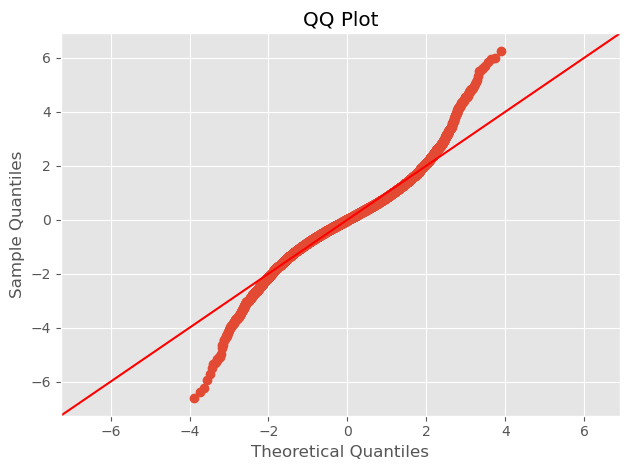

In [251]:
plt.figure(figsize=(12, 8))
fig = sm.graphics.qqplot(model4.resid, dist=stats.norm, line='45', fit=True)
plt.title('QQ Plot')
plt.tight_layout()
plt.show()

In [252]:
# since most of the data points fall along a straight line, we can consider the normality assumption satisfied

Text(0.5, 0.99, 'Residuals Scatterplot')

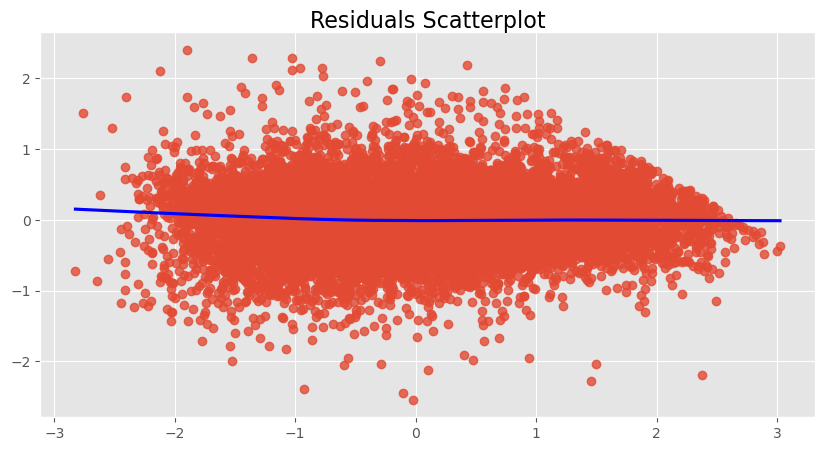

In [253]:
plt.figure(figsize=(10,5))
sns.regplot(x=model4.predict(), y=model4.resid, lowess=True, line_kws={'color': 'blue'})
plt.title('Residuals Scatterplot', fontsize=16, y=.99)

In [254]:
# the points seem to have a mostly symmetrical shape across the x axes and is mostly hoscedastic.

In [255]:
# I want to test if the distance is a better indicator than the zipcode, as the geographic feature

In [256]:
m3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20708 entries, 0 to 20707
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          20708 non-null  float64
 1   bedrooms       20708 non-null  int64  
 2   bathrooms      20708 non-null  float64
 3   sqft_living    20708 non-null  int64  
 4   floors         20708 non-null  float64
 5   condition      20708 non-null  int64  
 6   grade          20708 non-null  int64  
 7   zipcode        20708 non-null  int64  
 8   sqft_living15  20708 non-null  int64  
 9   sqft_lot15     20708 non-null  int64  
 10  year_sold      20708 non-null  int64  
 11  renovated      20708 non-null  int64  
 12  has_basement   20708 non-null  int64  
 13  distance       20708 non-null  float64
dtypes: float64(4), int64(10)
memory usage: 2.2 MB


In [257]:
m5 = m3.drop(columns=['bathrooms'])

continuous = [
 'price',
 'sqft_living',
 'sqft_living15', 'distance'
 ]
categoricals = [
 'bedrooms',
 'grade', 
 'condition',
 'renovated',
 'has_basement'
]

cln_cont = m5[continuous]

# log features
log_names = [f"{column}_log" for column in cln_cont.columns]

cln_log = np.log(cln_cont)
cln_log.columns = log_names

# normalize (subract mean and divide by std)
def normalize(feature):
    return (feature - feature.mean()) / feature.std()


cln_log_norm = cln_log.apply(normalize)

# one hot encode categoricals
cln_ohe = pd.get_dummies(m5[categoricals], columns=categoricals, drop_first=True)

preprocessed5 = pd.concat([cln_log_norm, cln_ohe], axis=1)

X = preprocessed5.drop("price_log", axis=1)
y = preprocessed5["price_log"]

crossvalidation = KFold(n_splits=10, shuffle=True, random_state=1)
baseline = np.mean(cross_val_score(regression, X, y, scoring="r2", cv=crossvalidation))

baseline

0.7060405718264561

In [258]:
outcome = 'price_log'
x_cols = preprocessed5.drop("price_log", axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model5 = ols(formula=formula, data=preprocessed5).fit()
model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                     2173.
Date:                Thu, 15 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:35:56   Log-Likelihood:                -16664.
No. Observations:               20708   AIC:                         3.338e+04
Df Residuals:                   20684   BIC:                         3.357e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  0.3070      0.552      0.556      0.578      -0.775       1.389
bedrooms_2[T.True]        -0.0370      0.042     -0.887      0.375      -0.119       0.045
bedrooms_3[T.True]        -0.1487      0.042     -3.543      0.000      -0.231      -0.066
bedrooms_4[T.True]        -0.1942      0.043     -4.502      0.000      -0.279      -0.110
bedrooms_5[T.True]        -0.2273      0.046     -4.988      0.000      -0.317      -0.138
bedrooms_6[T.True]        -0.2619      0.057     -4.585      0.000      -0.374      -0.150
grade_4[T.True]           -1.1880      0.552     -2.152      0.031      -2.270      -0.106
grade_5[T.True]           -1.2342      0.544     -2.269      0.023      -2.300      -0.168
grade_6[T.True]           -1.1099      0.543     -2.043      0.041      -2.175      -0.045
grade_7[T.True]           -0.8425      0.543     -1.551      0.121      -1.908       0.223
grade_8[T.True]           -0.5817      0.544     -1.070      0.285      -1.647       0.484
grade_9[T.True]           -0.2530      0.544     -0.465      0.642      -1.319       0.813
grade_10[T.True]           0.0122      0.544      0.022      0.982      -1.054       1.079
grade_11[T.True]           0.2081      0.545      0.382      0.703      -0.860       1.276
grade_12[T.True]           0.4100      0.554      0.741      0.459      -0.675       1.495
condition_2[T.True]        0.1903      0.111      1.709      0.087      -0.028       0.409
condition_3[T.True]        0.4670      0.103      4.518      0.000       0.264       0.670
condition_4[T.True]        0.6431      0.103      6.217      0.000       0.440       0.846
condition_5[T.True]        0.7950      0.104      7.641      0.000       0.591       0.999
renovated_1[T.True]        0.2893      0.022     13.448      0.000       0.247       0.331
has_basement_1[T.True]    -0.0593      0.009     -6.750      0.000      -0.077      -0.042
sqft_living_log            0.3618      0.008     45.630      0.000       0.346       0.377
sqft_living15_log          0.2377      0.006     39.143      0.000       0.226       0.250
distance_log              -0.4522      0.004   -107.350      0.000      -0.461      -0.444
==============================================================================
Omnibus:                      184.174   Durbin-Watson:                   1.076
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              248.120
Skew:                          -0.128   Prob(JB):                     1.32e-54
Kurtosis:                       3.471   Cond. No.                         696.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [259]:
# By removing the zipcode categorical feature and replacing with the distance continuous feature the following has changed:
    # adjusted r2 has decreased to .707
    # the log-likelihood has significantly decreased indicating a better fit than previous model but the number of features has also increased
# the intercept p value has increased to 0.578, meaning that it is not significant and could be left at 0 
# there are a number of features with p value greater than .05, meaning that it is not significant and could be left at 0 or removed
# Omnibus has significantly decreased, meaning the errors are more normally distributed
# the skew has remained fairly close to 0
# the kurtosis has lowered impying that the model is not as good as the previous model but its only changed by 2.6
# the Durban-Watson is between 1 and 2 meaning it is relatively homoscedastic
# the JB has lowered significantly but still indicates that the errors are not normally distributed
# condition number has slightly lowered indicating that we have eliminated more multicollinearity, but this change is minimal

<Figure size 1200x800 with 0 Axes>

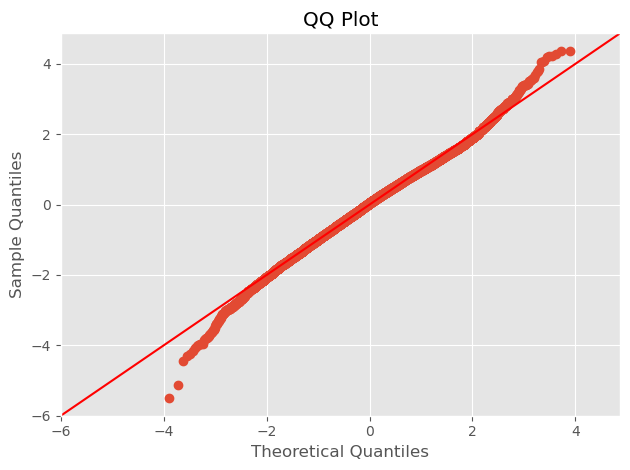

In [260]:
plt.figure(figsize=(12, 8))
fig = sm.graphics.qqplot(model5.resid, dist=stats.norm, line='45', fit=True)
plt.title('QQ Plot')
plt.tight_layout()
plt.show()

In [261]:
# since most of the data points fall along a straight line, we can consider the normality assumption satisfied, and this is much better than the previous model

Text(0.5, 0.99, 'Residuals Scatterplot')

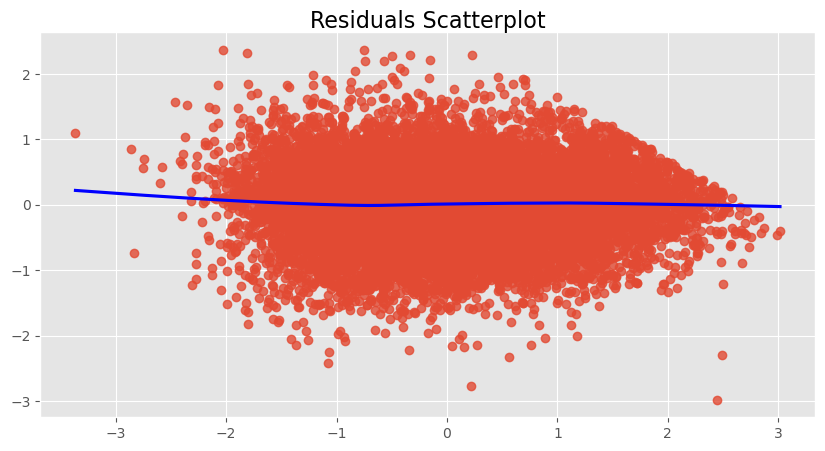

In [262]:
plt.figure(figsize=(10,5))
sns.regplot(x=model5.predict(), y=model5.resid, lowess=True, line_kws={'color': 'blue'})
plt.title('Residuals Scatterplot', fontsize=16, y=.99)

In [263]:
# there is very little difference to the previous model.

In [264]:
# I will test both model 4 and model 5 to see if one has better MSE and R2 results

In [265]:
#create test and training data subsets
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [266]:
X_train, X_test, y_train, y_test = train_test_split(preprocessed4, preprocessed4.price_log)
train, test = train_test_split(preprocessed4,test_size=.25,shuffle=True)

In [267]:
df_train = pd.DataFrame(X_train, y_train)
df_test = pd.DataFrame(X_test, y_test)

In [268]:
#look at the shape of the subsets
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(15531, 92) (15531,) (5177, 92) (5177,)


In [269]:
#fit the data 
linreg = LinearRegression()
linreg.fit(X_train, y_train)

LinearRegression()

In [270]:
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test)

In [271]:
train_mse = np.mean(y_train-y_pred_train)**2
test_mse = np.mean(y_test-y_pred_test)**2

train_r2 = r2_score(train['price_log'], model4.predict(train))
test_r2 = r2_score(test['price_log'], model4.predict(test))

print('Mean Squared Error Train:', train_mse)
print('Mean Squared Error Test:', test_mse)
print(f'R-Squared Train = {round(train_r2,2)}')
print(f'R-Squared Test = {round(test_r2,2)}')

Mean Squared Error Train: 3.969711866977211e-06
Mean Squared Error Test: 3.5727406802259723e-05
R-Squared Train = 0.85
R-Squared Test = 0.86


In [272]:
X_train, X_test, y_train, y_test = train_test_split(preprocessed5, preprocessed5.price_log)
train, test = train_test_split(preprocessed5,test_size=.25,shuffle=True)

In [273]:
df_train = pd.DataFrame(X_train, y_train)
df_test = pd.DataFrame(X_test, y_test)

In [274]:
#look at the shape of the subsets
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(15531, 24) (15531,) (5177, 24) (5177,)


In [275]:
#fit the data 
linreg = LinearRegression()
linreg.fit(X_train, y_train)

LinearRegression()

In [276]:
train_mse = np.mean(y_train-y_pred_train)**2
test_mse = np.mean(y_test-y_pred_test)**2

train_r2 = r2_score(train['price_log'], model5.predict(train))
test_r2 = r2_score(test['price_log'], model5.predict(test))

print('Mean Squared Error Train:', train_mse)
print('Mean Squared Error Test:', test_mse)
print(f'R-Squared Train = {round(train_r2,2)}')
print(f'R-Squared Test = {round(test_r2,2)}')

Mean Squared Error Train: 3.6052319811511544e-06
Mean Squared Error Test: 6.588002675629145e-06
R-Squared Train = 0.71
R-Squared Test = 0.71


In [277]:
#1. How do home renovations effect house prices?

<Axes: xlabel='renovated', ylabel='price'>

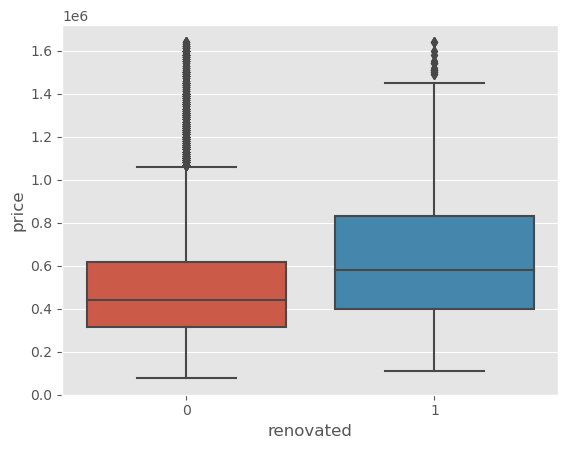

In [278]:
sns.boxplot(x='renovated', y='price', data=m2)


<Axes: xlabel='renovated'>

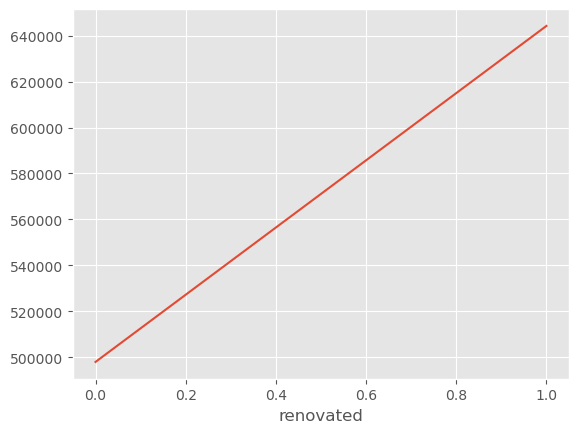

In [279]:
m2.groupby(['renovated'])['price'].mean().plot()

In [280]:
mean_compare.describe()

,zipcode,nonren_mean_price,ren_mean_price,ren_price_increase,reng10_mean_price,reng10_price_increase,ren10_mean_price,ren10_price_increase,ren5_mean_price,ren5_price_increase
count,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000,46.0000
mean,98093.8478,531155.0675,614146.6644,82991.5968,533983.5737,2828.5062,535656.9366,4501.8690,609430.5673,78275.4997
std,55.0890,206905.8121,245053.9555,115448.5376,207690.3095,4201.6732,208221.5899,5879.8225,270601.4312,149084.2389
min,98003.0000,238708.5191,251116.6667,-198762.9262,239042.4419,-2380.6226,238986.3134,-5629.4511,218996.6667,-185282.1570
25%,98044.5000,351386.4411,382498.1667,3034.2200,354768.4123,172.9999,354867.7224,78.0310,389250.0000,-28109.9967
50%,98106.5000,516789.6661,622921.8750,69234.1347,529284.1943,1063.9724,536871.9777,2854.4891,598675.0000,76792.8672
75%,98125.7500,706810.1657,782154.3269,168430.5967,710115.1473,4511.3128,712487.0214,8280.8114,836091.9643,122578.2125
max,98199.0000,1006439.1745,1176647.0588,421035.2887,1019440.9912,14104.2293,1019074.6943,25517.2902,1300000.0000,542329.0457


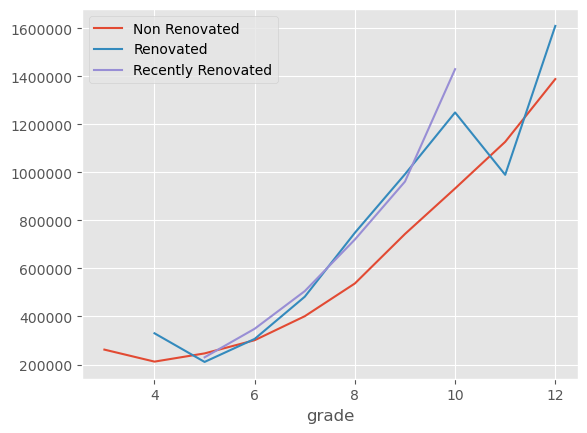

In [281]:
nr_grade = m2.groupby(['grade'])['price'].mean().plot(label = 'Non Renovated')
r_grade = ren_data.groupby(['grade'])['price'].mean().plot(label = 'Renovated')
r5_grade = ren5_data.groupby(['grade'])['price'].mean().plot(label = 'Recently Renovated')
plt.ticklabel_format(useOffset=False, style='plain')
plt.legend()

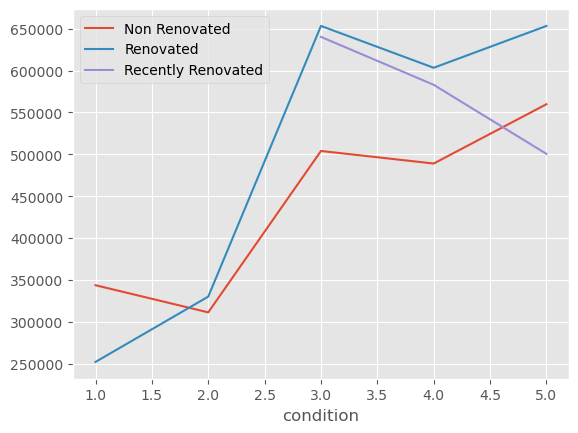

In [282]:
nr_condition = m2.groupby(['condition'])['price'].mean().plot(label = 'Non Renovated')
r_condition = ren_data.groupby(['condition'])['price'].mean().plot(label = 'Renovated')
r5_condition = ren5_data.groupby(['condition'])['price'].mean().plot(label = 'Recently Renovated')
plt.ticklabel_format(useOffset=False, style='plain')
plt.legend()

In [283]:
# The median price for renovated properties is significantly higher than the non renovated properties. 
# Both condition and grade are posatively affected by renovation, noting that recently renovated does not have a condition rating below 3.
# This would indicate that homes who have a condition lower than 3 and/or a grade lower than 6 can significantly increase the value of their property with renovations

In [284]:
#2. What criterea should be attempted to be acheived by renovations?

# Ideally increasing amenities (bedrooms), and living area sizes will have a posative impact on the value of properties but the largest change would come from the increase in grade. 

In [290]:
m2['cg']=m2['grade']*m2['condition']

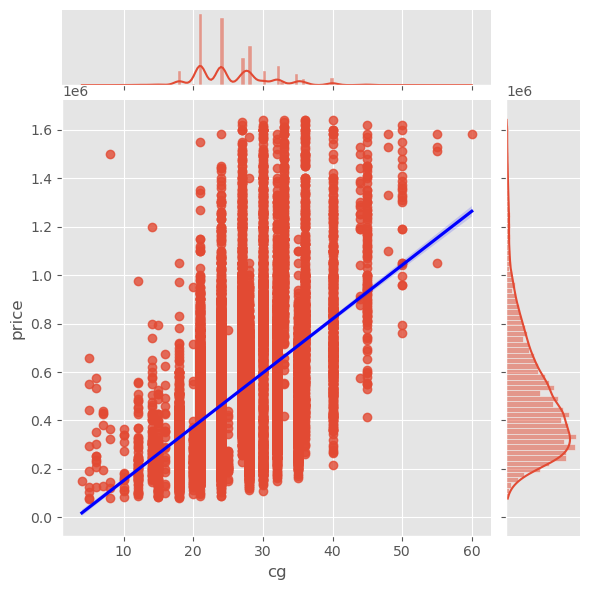

In [291]:
sns.jointplot(data = m2, x= 'cg', y ='price', kind='reg', joint_kws={'line_kws':{'color':'blue'}})

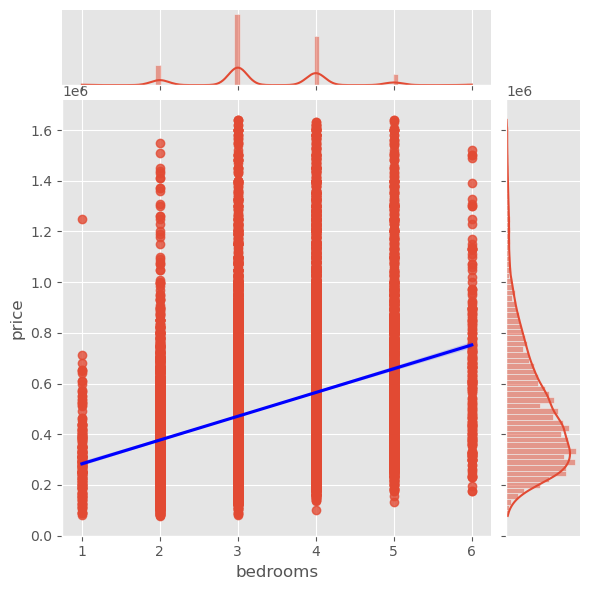

In [292]:
sns.jointplot(data = m2, x= 'bedrooms', y ='price', kind='reg', joint_kws={'line_kws':{'color':'blue'}})

In [ ]:
sns.jointplot(data = m2, x= 'sqft_living', y ='price', kind='reg', joint_kws={'line_kws':{'color':'blue'}})

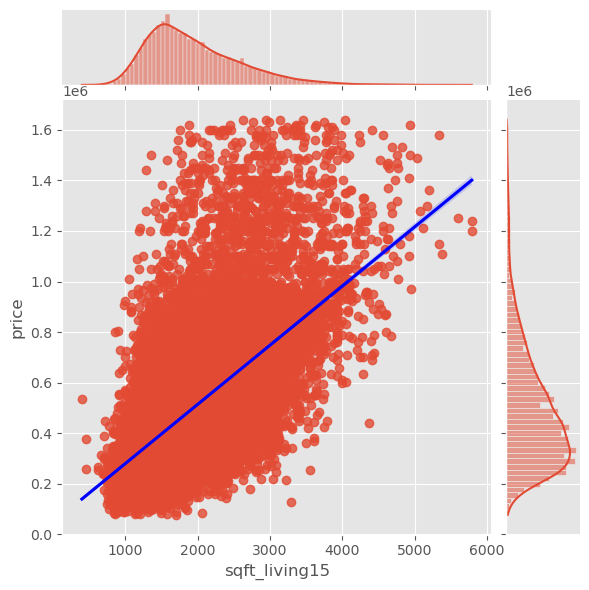

In [293]:
sns.jointplot(data = m2, x= 'sqft_living15', y ='price', kind='reg', joint_kws={'line_kws':{'color':'blue'}})

In [294]:
#3. Where should property searches be conducted for renovating properties and marketing for clients?

In [295]:
# Visualise the mean of increase in value over mean price per zipcode
color_scale = "Cividis"

fig = px.scatter_mapbox(ren_data.groupby(['zipcode']).mean(), 
                        lat="lat", 
                        lon="long", 
                        hover_name="value_add", 
                        hover_data=["value_add", "age"],
                        color="value_add",
                        color_continuous_scale=color_scale,
                        size_max=15,
                        size="price",
                        zoom=10, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [296]:
# Visualise the areas with significant representation of older homes
color_scale = "Cividis"

fig = px.scatter_mapbox(m2.groupby(['zipcode']).mean(), 
                        lat="lat", 
                        lon="long", 
                        hover_name="age", 
                        hover_data=["age"],
                        color="age",
                        color_continuous_scale=color_scale,
                        size_max=15,
                        size="age",
                        zoom=10, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [297]:
# Visualise the areas with higher mean prices by zipcode
color_scale = "Cividis"

fig = px.scatter_mapbox(m2.groupby(['zipcode']).mean(), 
                        lat="lat", 
                        lon="long", 
                        hover_name="price", 
                        hover_data=["price"],
                        color="price",
                        color_continuous_scale=color_scale,
                        size_max=15,
                        size="age",
                        zoom=10, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [298]:
# Visualise the areas by grade average per zipcode
color_scale = "Cividis"

fig = px.scatter_mapbox(m2.groupby(['zipcode']).mean(), 
                        lat="lat", 
                        lon="long", 
                        hover_name="grade", 
                        hover_data=["grade"],
                        color="grade",
                        color_continuous_scale=color_scale,
                        size_max=15,
                        size="grade",
                        zoom=10, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [299]:
# Visualise the areas by condition average per zipcode
color_scale = "Cividis"

fig = px.scatter_mapbox(m2.groupby(['zipcode']).mean(), 
                        lat="lat", 
                        lon="long", 
                        hover_name="condition", 
                        hover_data=["condition"],
                        color="condition",
                        color_continuous_scale=color_scale,
                        size_max=15,
                        size="condition",
                        zoom=10, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [300]:
# Create a condition*grade feature
test = m2
test['cg'] = (test['condition']/5)*(test['grade']/12)*60

In [301]:
# Visualise the areas by condition average per zipcode
color_scale = "Cividis"

fig = px.scatter_mapbox(m2.groupby(['zipcode']).mean(), 
                        lat="lat", 
                        lon="long", 
                        hover_name="cg", 
                        hover_data=["cg"],
                        color="cg",
                        color_continuous_scale=color_scale,
                        size_max=15,
                        size="cg",
                        zoom=10, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [302]:
# show zipcodes with the lowest condition x grade x age
pc = m2
pc['areas_to_search'] = pc['cg']*pc['age']

pc.head()

,price,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,yr_renovated,zipcode,...,age,month_sold,year_sold,renovated,has_basement,distance,map,ren5,cg,areas_to_search
0,221900.0000,3,1.0000,1180,1.0000,0.0000,3,7,0.0000,98178,...,61,10,2014,0,0,11.9861,13,0,21.0000,1281.0000
1,205425.0000,2,1.0000,880,1.0000,0.0000,4,6,0.0000,98178,...,71,6,2014,0,0,13.3164,13,0,24.0000,1704.0000
2,445000.0000,3,2.2500,2100,1.0000,0.0000,3,8,0.0000,98178,...,49,7,2014,0,1,12.6744,13,0,24.0000,1176.0000
3,236000.0000,3,1.0000,1300,1.0000,0.0000,3,7,0.0000,98178,...,55,9,2014,0,0,12.6377,13,0,21.0000,1155.0000
4,170000.0000,2,1.0000,860,1.0000,0.0000,3,6,0.0000,98178,...,85,2,2015,0,0,12.1573,13,0,18.0000,1530.0000


In [303]:
asdf = pc.groupby(by=['zipcode'])['areas_to_search'].mean().sort_values(ascending=True)

asdf.head(10)

zipcode
98065   410.0236
98053   439.2527
98038   476.7038
98029   494.8471
98019   532.4793
98075   638.1507
98092   687.8261
98074   705.6168
98045   731.7563
98059   732.2390
Name: areas_to_search, dtype: float64

In [304]:
# I would suggest that; 
# Areas with larger concentration of older homes would provide more opportunity for homes in need of renovation
# Areas with larger concentration of low grade and low condition homes
# Areas already proven to have renovated homes with prices above the area average
# Areas with a higher average price levels will produce greater returns